In [3]:
#	№    For copying
import os
import pandas as pd
import seaborn as sns
import geopandas as gpd
from random import randint
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from draw import Histogram, Piechart, Map, StackedBar
from helper import CountryHelper,JobHelper, SexHelper

models = ["ChatGPT","Claude","DeepSeek","Gemini"]
case_studies = ["Career Development","Family Health","Financial Literacy","Media Literacy"]
dataset = "Career Development"

dfs = {
    case_study: {
        model:pd.read_csv(os.path.join("Case Studies",case_study,f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}

# dfs = {}
# for case_study in case_studies:
#     these_dfs = {
#         model:pd.read_excel(
#             os.path.join("Case Studies",case_study,f"{case_study}.xlsx"),
#             sheet_name=model,
#             nrows=51, #Header (1) + Data (50)
#             header=[1,2] if case_study in ['Career Development','Family Health'] else [1]
#         )
#         for model in models
#     }
    
#     for df in these_dfs.values():
#         df.columns = [
#             ' '.join(map(str,[    
#                 item for item in [(col,),col][type(col) is tuple] #Ensure col is a tuple
#                 if 'unnamed' not in str(item).lower() #Remove unnamed columns
#             ])).strip()
#             for col in df.columns
#         ]
#         df['Batch'] = df['Batch'].ffill().astype(int)
        
#     these_dfs = {df_i:df.drop(columns=[''], errors='ignore') for df_i,df in these_dfs.items()}
#     dfs[case_study] = these_dfs

# for case_study in dfs:
#     for model_df in dfs[case_study]:
#         dfs[case_study][model_df].to_csv(os.path.join("Case Studies",case_study,f"{model_df}.csv"),index=False)



data_folder = os.path.join('Case Studies', 'Career Development', 'data')
#Create subdirectories for client and counselor if they don't exist
for folder in ['client','counselor']:
    sub_folder_path = os.path.join(data_folder, folder)
    if not os.path.exists(sub_folder_path):
        os.makedirs(sub_folder_path)
    

chizu = Map(models)
piechart = Piechart(models)
stackedBar = StackedBar(models)
histogram = Histogram(models)

sexHelper = SexHelper()
countryHelper = CountryHelper()
jobHelper = JobHelper()


# Prepare Client DataFrame
client_df = {
    model: df[[
            "Batch","№","Client Name","Client Sex",
            "Client Age","Client Race","Client Country of Origin",
            "Client Education", "Client Employment"
    ]].rename(columns={
        'Client Country of Origin':'Client Country of Residence',
        'Client Name': 'Name',
        'Client Sex': 'Sex',
        'Client Age': 'Age',
        'Client Race': 'Race',
        'Client Education': 'Education',
        'Client Employment': 'Employment'
    })
    for model,df in dfs[dataset].items()
}

# Prepare Counselor DataFrame
counselor_df = {
    model: df[[
            "Batch","№","Counselor Name","Counselor Sex",
            "Counselor Age","Counselor Race","Counselor Country of Origin",
            "Counselor Education", # Assuming Counselor Employment might not be present or needed
    ]].rename(columns={
        'Counselor Country of Origin':'Counselor Country of Residence',
        'Counselor Name': 'Name',
        'Counselor Sex': 'Sex',
        'Counselor Age': 'Age',
        'Counselor Race': 'Race',
        'Counselor Education': 'Education'
    })
    for model,df in dfs[dataset].items()
}

C:\Users\Gabriel_Freeze\AppData\Local\Temp\ipykernel_20916\3949005988.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(avg_age_male, shade=True, label='Male', color='blue')
C:\Users\Gabriel_Freeze\AppData\Local\Temp\ipykernel_20916\3949005988.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(avg_age_female, shade=True, label='Female', color='pink')


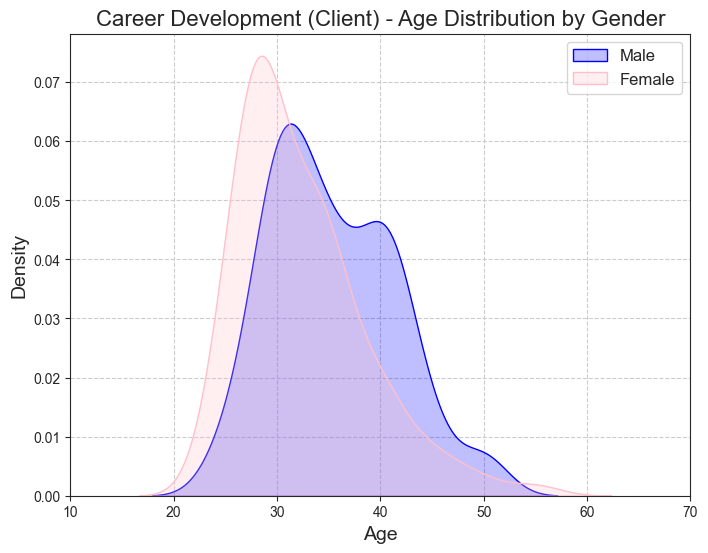

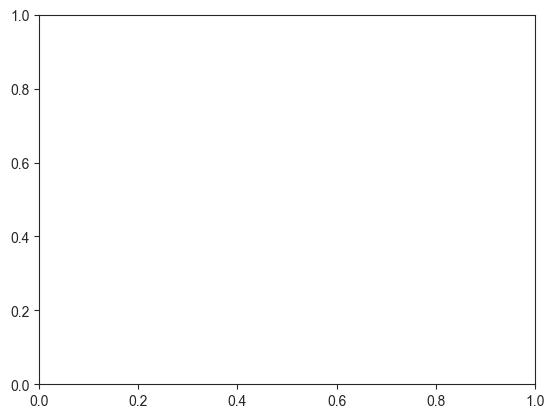

In [4]:
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Client Sex'] = df['Client Sex'].apply(sexHelper.sex2standard)
avg_age_male   = df[df['Client Sex'] == 'Male']  ['Client Age']  
avg_age_female = df[df['Client Sex'] == 'Female']['Client Age']

plt.figure(figsize=(8, 6))
sns.kdeplot(avg_age_male, shade=True, label='Male', color='blue')
sns.kdeplot(avg_age_female, shade=True, label='Female', color='pink')
plt.xlabel('Age')
plt.ylabel('Density')
plt.xlim(10, 70)
plt.grid(True)
plt.title(f'{dataset} (Client) - Age Distribution by Gender')
plt.legend()
plt.show()
plt.grid(False)


In [5]:
df['Client Sex'] = df['Client Sex'].apply(sexHelper.sex2standard)

mean_ages = df[df['Client Sex'].isin(['Male', 'Female'])].groupby(['model', 'Client Sex'])['Client Age'].mean().unstack()[['Male', 'Female']].apply(lambda x: round(x,0))
print(mean_ages)

Client Sex  Male  Female
model                   
ChatGPT     35.0    31.0
Claude      36.0    36.0
DeepSeek    32.0    31.0
Gemini      38.0    32.0


### Counsellor Age vs. Client Age (by Gender)

In [6]:
# Merge counselor and client data
merged_df = pd.concat([
    counselor_df[model].assign(model=model, 
                               Counselor_Sex=counselor_df[model]['Sex'].apply(sexHelper.sex2standard))
    .merge(
        client_df[model].assign(model=model, 
                                Client_Sex=client_df[model]['Sex'].apply(sexHelper.sex2standard)),
        on=['Batch', '№', 'model'],
        suffixes=('_counselor', '_client')
    )
    for model in models
], ignore_index=True)

# Calculate mean counselor age by counselor sex and client sex
mean_counselor_age = merged_df.groupby(['Counselor_Sex', 'Client_Sex'])['Age_counselor'].mean().round(1)
print("Mean Counselor Age by Counselor Sex and Client Sex:")
print(mean_counselor_age)

# Calculate mean client age by counselor sex and client sex
mean_client_age = merged_df.groupby(['Counselor_Sex', 'Client_Sex'])['Age_client'].mean().round(1)
print("\nMean Client Age by Counselor Sex and Client Sex:")
print(mean_client_age)

Mean Counselor Age by Counselor Sex and Client Sex:
Counselor_Sex  Client_Sex
Female         Female        39.5
               Male          41.0
Male           Female        49.1
               Male          49.0
Other          Female        42.0
               Male          38.0
Name: Age_counselor, dtype: float64

Mean Client Age by Counselor Sex and Client Sex:
Counselor_Sex  Client_Sex
Female         Female        29.9
               Male          35.5
Male           Female        33.2
               Male          33.0
Other          Female        45.0
               Male          33.0
Name: Age_client, dtype: float64


## Career Development (Client)

### Country of Origin by Race (Map)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


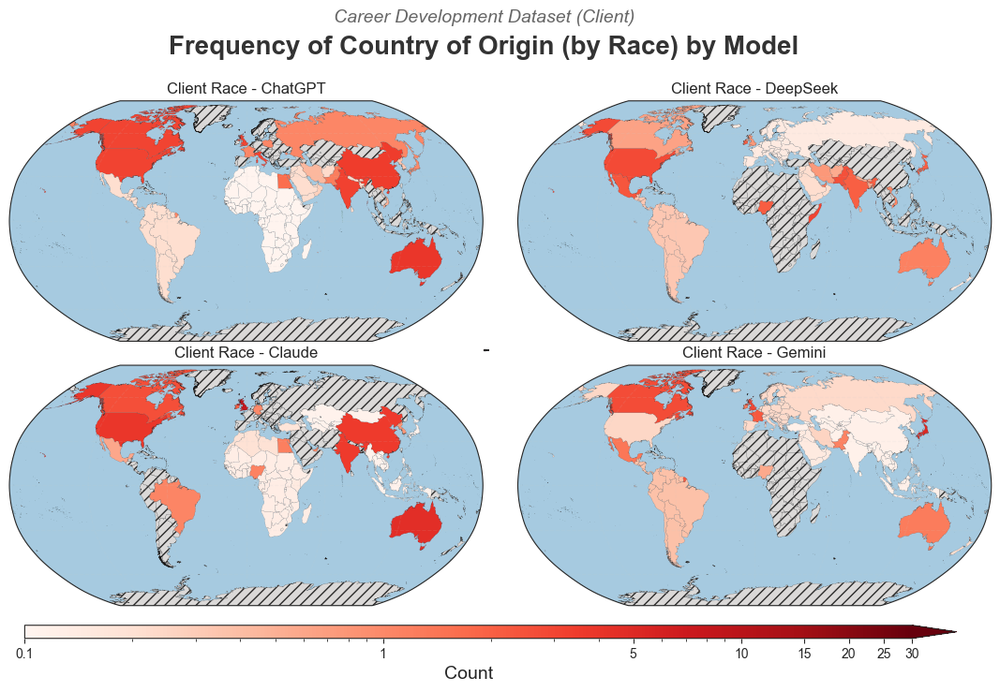

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


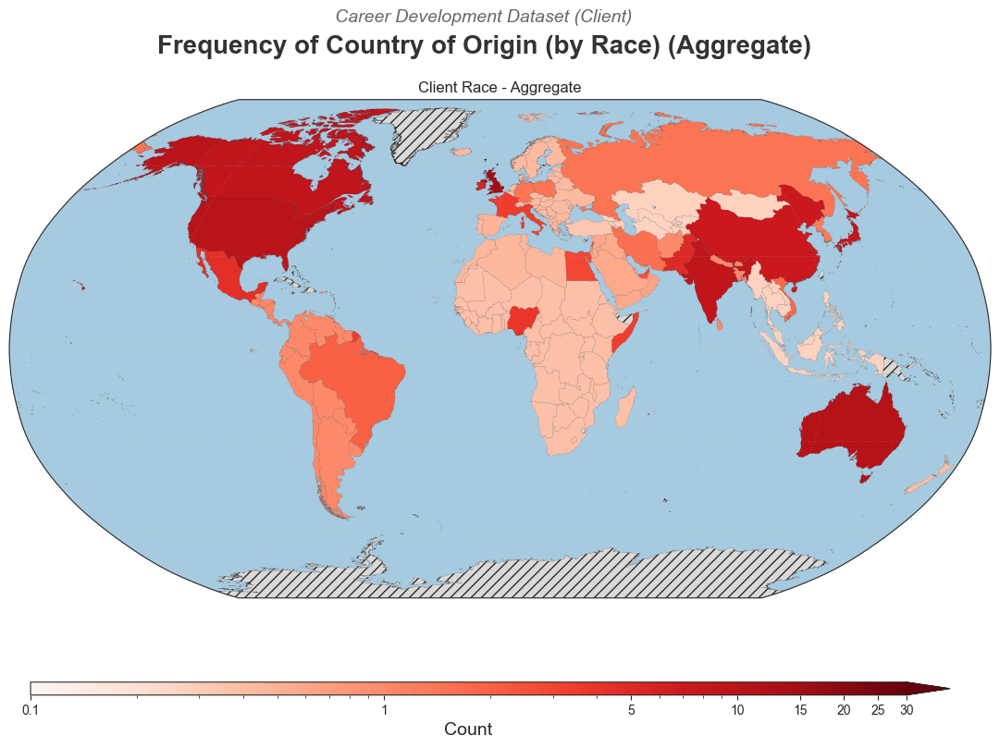

In [7]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = client_df[model].copy()
    df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Client Country of Origin'] = df['Race'].apply(countryHelper.race2country)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Client Country of Origin',
        title=f'Client Race - {model}',
        cmap='Reds', ax=axs[i%2][i//2],step=5,
        low_poly=False, log=True,
        max_count=30, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Frequency of Country of Origin (by Race) by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Client)', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)

df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.fix_country_naming)
df['Client Country of Origin'] = df['Race'].apply(countryHelper.race2country)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Client Country of Origin',
    title=f'Client Race - Aggregate',
    cmap='Reds', ax=ax, step=5,
    low_poly=False, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)

fig.suptitle('Frequency of Country of Origin (by Race) (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Client)', 
         ha='center', fontsize=14, color='#666666', style='italic')

plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Country of Origin by Race (Histogram)

Continent


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:312: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect

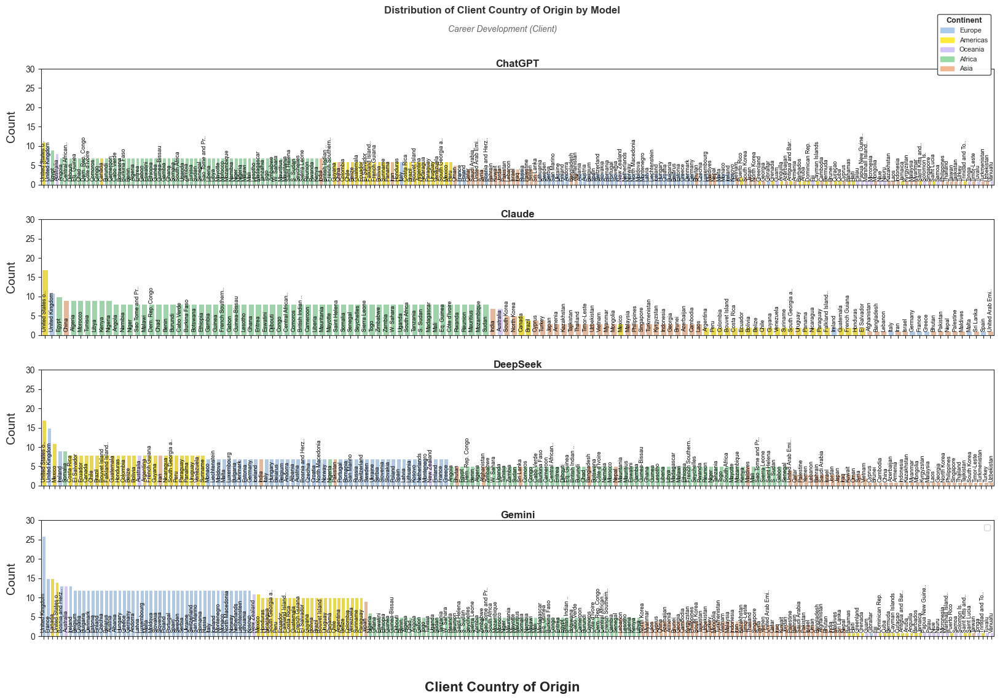

In [8]:
df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Country of Origin'] = df['Race']  \
    .apply(countryHelper.race2country) \
    .apply(countryHelper.fix_country_naming)

df_plot = df[["Client Country of Origin",'model']].copy()
df_plot = df_plot.explode('Client Country of Origin')
df_plot['Region'] = df_plot['Client Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df_plot['Continent'] = df_plot['Client Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = histogram.draw(
    df=df_plot,x='Client Country of Origin',
    hue='Continent',
    dataset=f'{dataset} (Client)', ylim=30,ystep=5,
    aggregate=False,long_layout=True,
    xtick_label_max_len=15,
    figsize=(20,12),legend=(1,1.5),
)

plt.legend(loc='upper right', fontsize='small') 

plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Histogram)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Origin by Race (Histogram).eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender Countries (Map)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


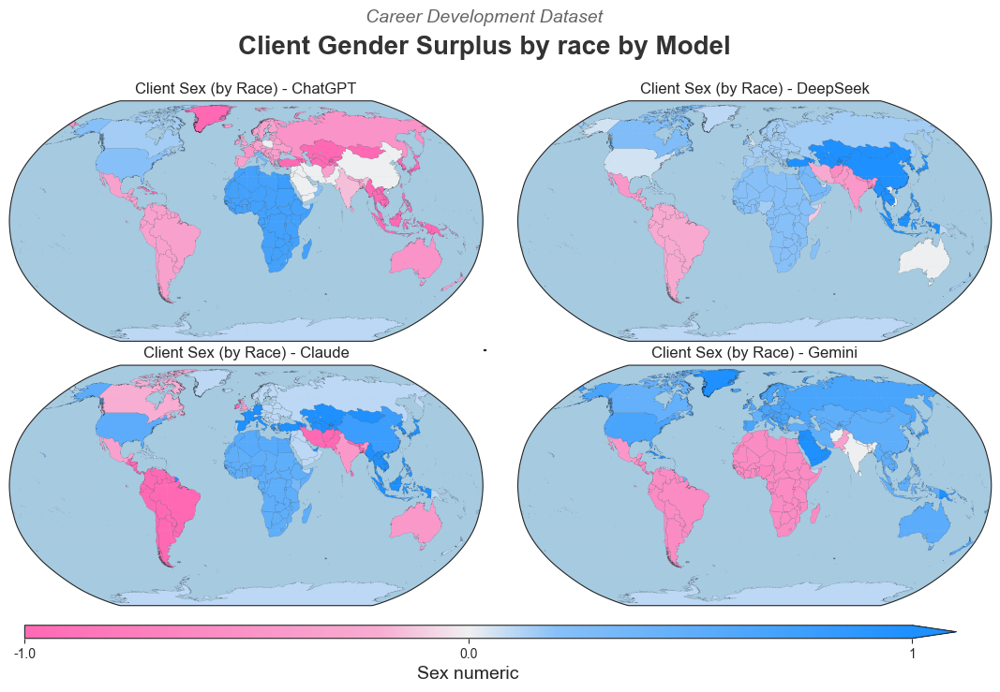

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


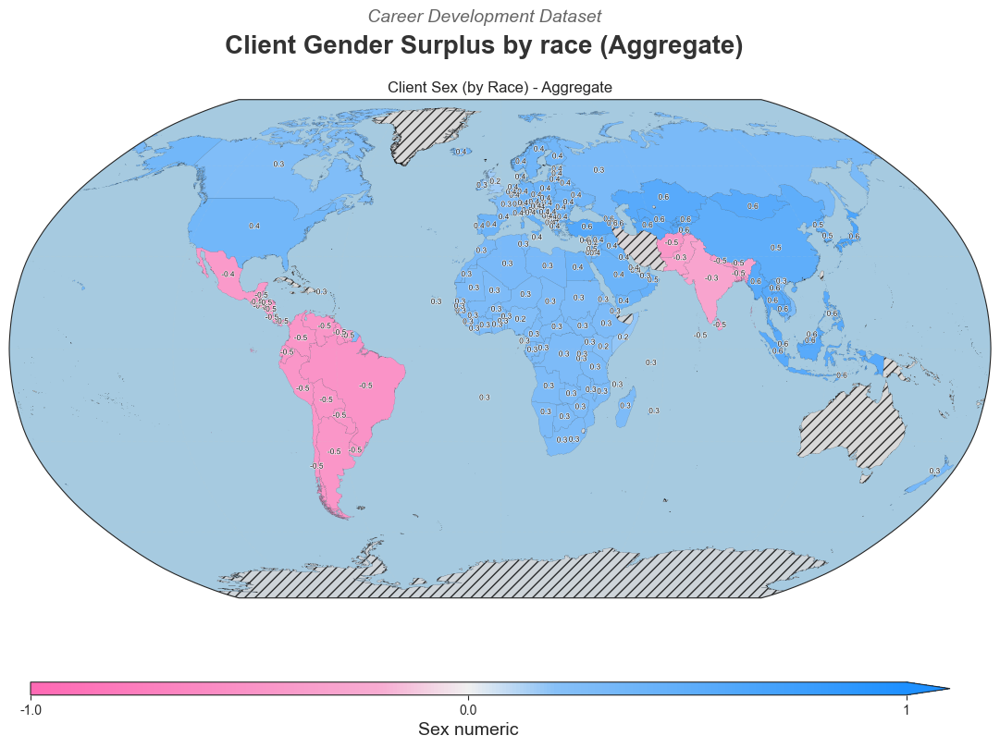

In [9]:
import matplotlib.colors as mcolors
pink_rgb = mcolors.to_rgb('#FF69B4') # Hot Pink
blue_rgb = mcolors.to_rgb('#1E90FF') # Dodger Blue
white_rgb = mcolors.to_rgb('#F0F0F0') # Slightly off-white

cmap = mcolors.LinearSegmentedColormap.from_list("sharper_pink_blue", list(zip([0.0, 0.4, 0.5, 0.6, 1.0], [pink_rgb, (pink_rgb[0]*0.5 + white_rgb[0]*0.5, pink_rgb[1]*0.5 + white_rgb[1]*0.5, pink_rgb[2]*0.5 + white_rgb[2]*0.5), white_rgb, (blue_rgb[0]*0.5 + white_rgb[0]*0.5, blue_rgb[1]*0.5 + white_rgb[1]*0.5, blue_rgb[2]*0.5 + white_rgb[2]*0.5), blue_rgb])))

share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = client_df[model]
    df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Country of Origin'] = df['Race'].apply(countryHelper.race2country)
    df['Sex Numeric'] = df['Sex'].apply(sexHelper.sex2standard).map({'Female': -1, 'Male': 1}).fillna(0).astype(int)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Country of Origin', y='Sex Numeric',
        cmap=cmap, apply_hatching=False, clamp_axis=(-1,1),
        title=f'Client Sex (by Race) - {model}', show_labels=False,
        ax=axs[i%2][i//2],step=1,
        low_poly=False, log=False,
        max_count=3, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Client Gender Surplus by race by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Gender Countries (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Gender Countries (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Gender Countries (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Gender Countries (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([client_df[model] for model in models], ignore_index=True)
df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.fix_country_naming)
df['Country of Origin'] = df['Race'].apply(countryHelper.race2country)
df['Sex Numeric'] = df['Sex'].apply(sexHelper.sex2standard).map({'Female': -1, 'Male': 1}).fillna(0).astype(int)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Country of Origin', y='Sex Numeric',
    # cmap= sns.diverging_palette(h_neg=340, h_pos=240, center='light', as_cmap=True),
    cmap= cmap,
    title=f'Client Sex (by Race) - Aggregate',
    ax=ax, step=1, show_labels=True, apply_hatching=True,
    low_poly=False, log=False, clamp_axis=(-1,1),
    max_count=3, legend=True,
    legend_loc=[0,-0.1,0,0]
)

fig.suptitle('Client Gender Surplus by race (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')

plt.savefig(os.path.join('Case Studies',dataset,'data',f"Gender Countries (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Gender Countries (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Gender Countries (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Gender Countries (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Country of Residence (Map + Histogram)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


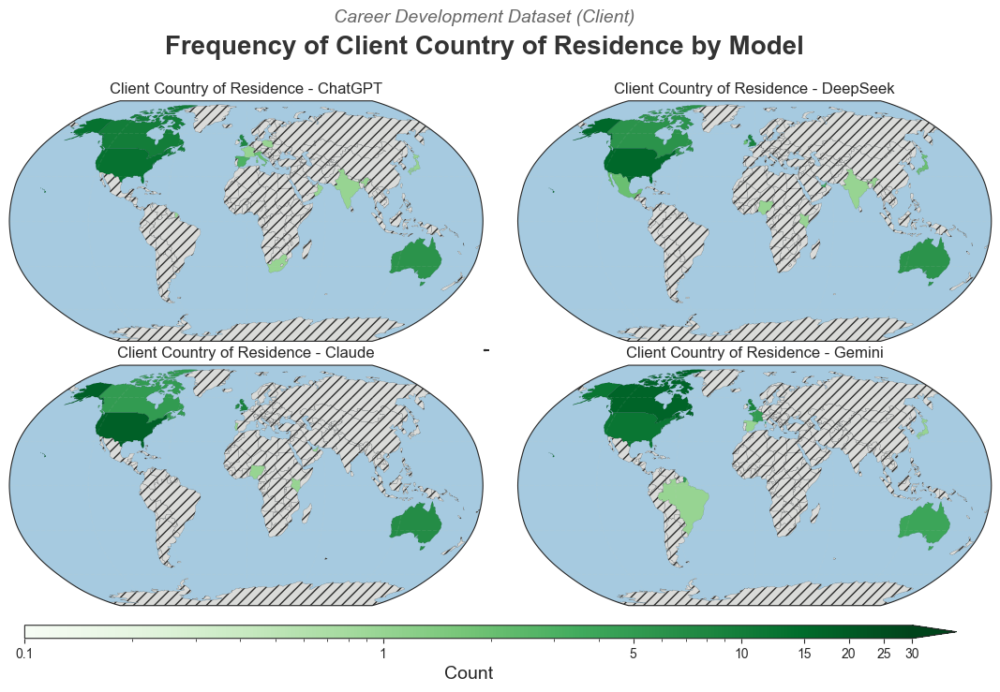

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


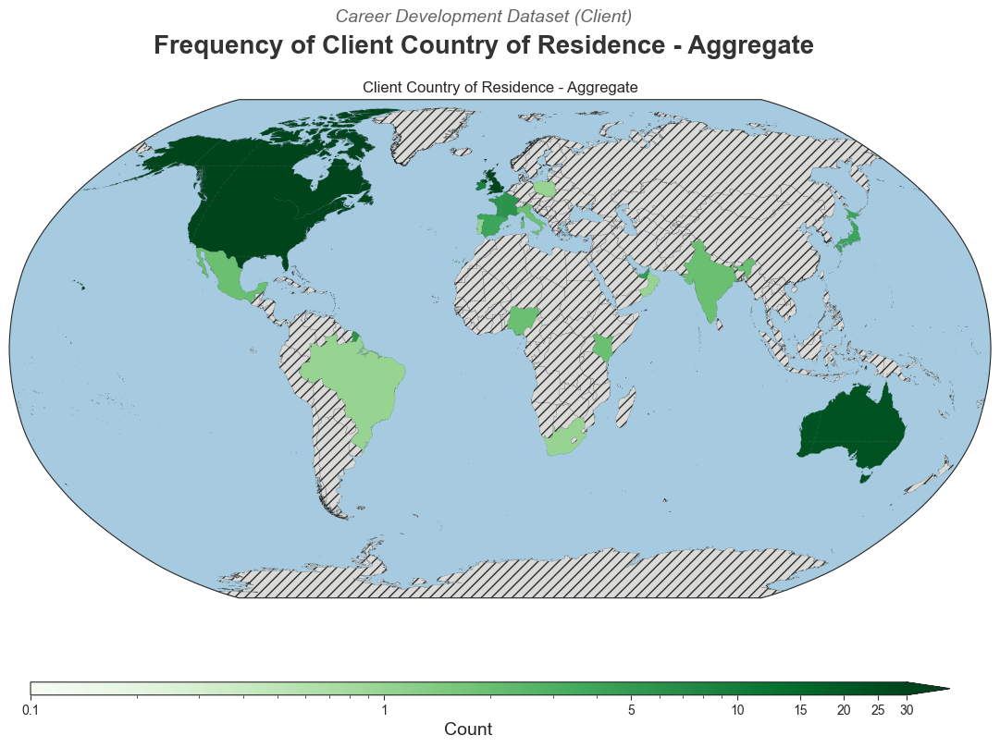

In [10]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = client_df[model].copy()
    df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.fix_country_naming)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Client Country of Residence',
        title=f'Client Country of Residence - {model}',
        cmap='Greens', ax=axs[i%2][i//2],
        low_poly=True, log=True, step=5,
        max_count=30, legend=[0,0,share_legend,0][i],
    )

fig.suptitle('Frequency of Client Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Client)', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.fix_country_naming)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Client Country of Residence',
    title=f'Client Country of Residence - Aggregate',
    cmap='Greens', ax=ax,step=5,
    low_poly=False, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Frequency of Client Country of Residence - Aggregate', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Client)', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:312: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


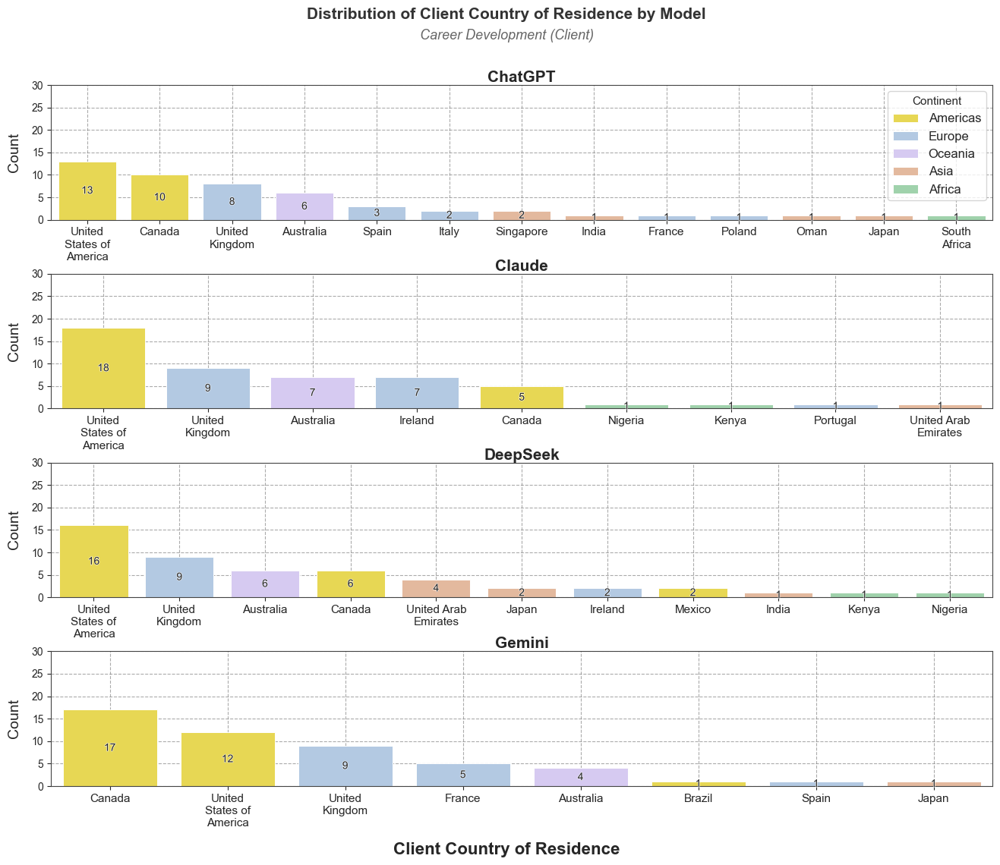

In [11]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.country2short)
df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.fix_country_naming)
df['Region'] = df['Client Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Client Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = histogram.draw(
    df=df,x='Client Country of Residence',
    hue='Continent', text_width=10, bar_labels=True,
    dataset=f'{dataset} (Client)', grid=True, ylim=30,ystep=5,
    aggregate=False,long_layout=True, title_size=15,
    figsize=(16,12), rotation=0,hspace=0.4
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Histogram)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country of Residence (Histogram).eps"), format='eps', bbox_inches='tight')
plt.show()

### Country Ordering (Stacked)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


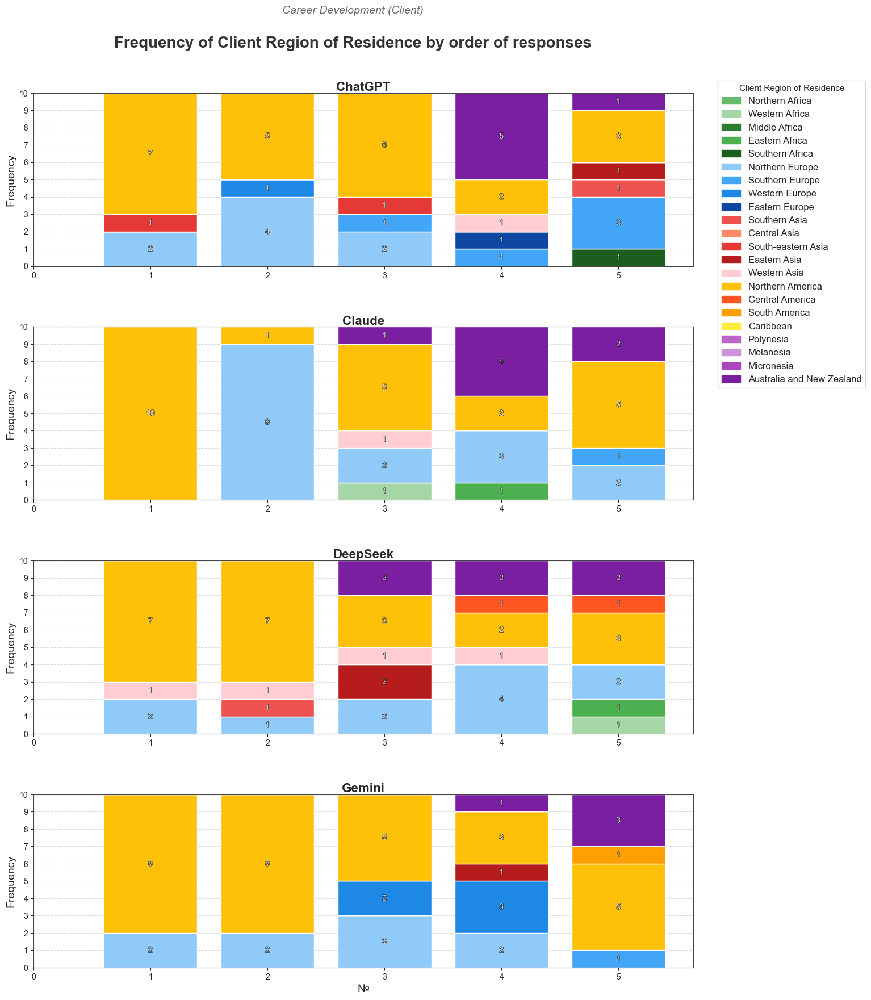

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


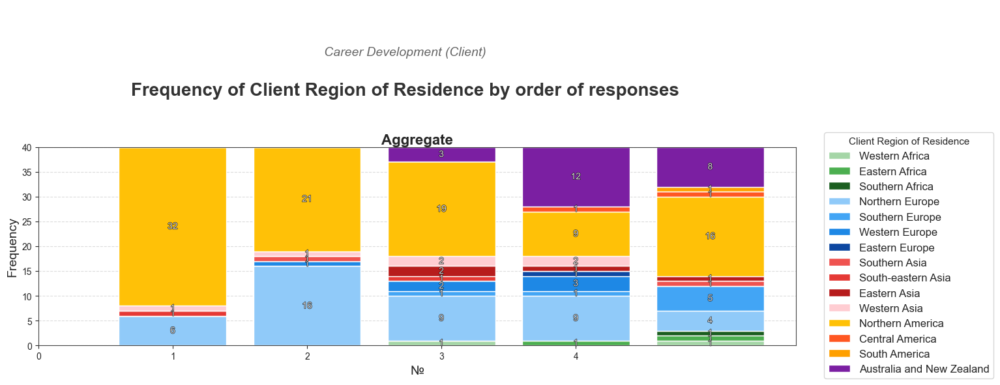

In [12]:
df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.country2short)
df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.fix_country_naming)
df['Client Region of Residence']  = df['Client Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Client Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Client Region of Residence',
    space=0.35, ylim=10, bar_labels=True, dataset=f'{dataset} (Client)',
    figsize=(15,20), grid=True, legend=True
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country Ordering (Stacked)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country Ordering (Stacked).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country Ordering (Stacked).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country Ordering (Stacked).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Client Region of Residence', aggregate=True,
    space=0.35, ylim=40, bar_labels=True, dataset=f'\n\n\n{dataset} (Client)', ystep=5,
    figsize=(15,20), grid=True, legend=True
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country Ordering (Stacked) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country Ordering (Stacked) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country Ordering (Stacked) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Country Ordering (Stacked) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Age and Country of Residence

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


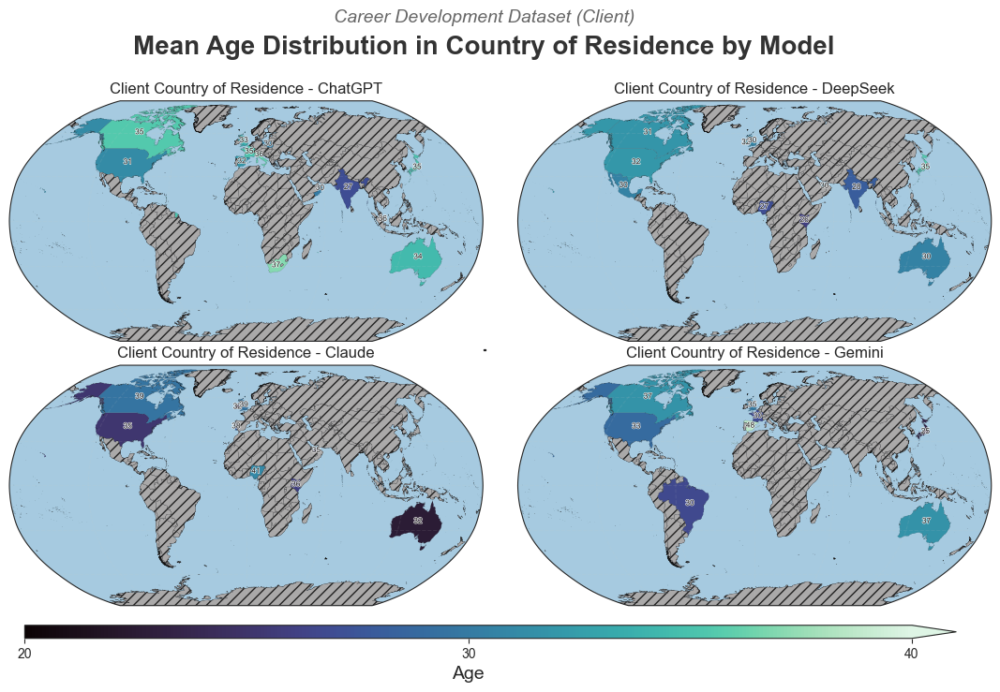

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


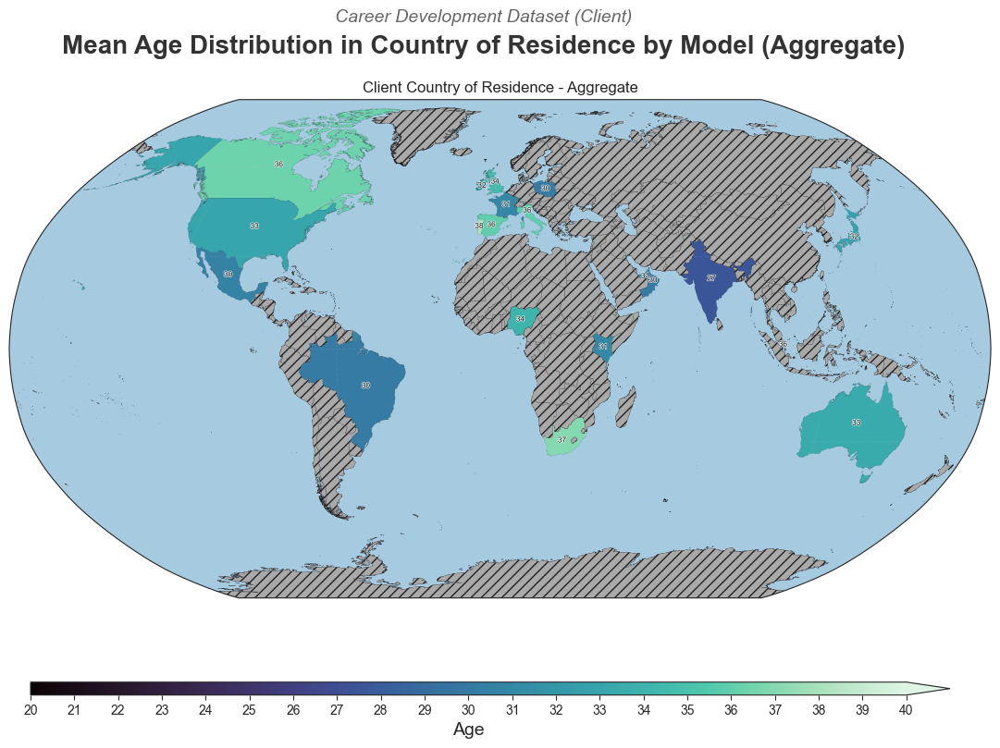

In [13]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = client_df[model].copy()
    df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Client Country of Origin'] = df['Race'].apply(countryHelper.race2country)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Client Country of Residence', y='Age',
        title=f'Client Country of Residence - {model}',
        cmap='mako', ax=axs[i%2][i//2], step=10,
        low_poly=False, log=False, show_labels=True,
        max_count=60, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Mean Age Distribution in Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Client)', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.fix_country_naming)
df['Client Country of Origin'] = df['Race'].apply(countryHelper.race2country)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Client Country of Residence',y='Age',
    title=f'Client Country of Residence - Aggregate',
    cmap='mako', ax=ax, step=1,
    low_poly=False, log=False, show_labels=True,
    max_count=60, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Mean Age Distribution in Country of Residence by Model (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Client)', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


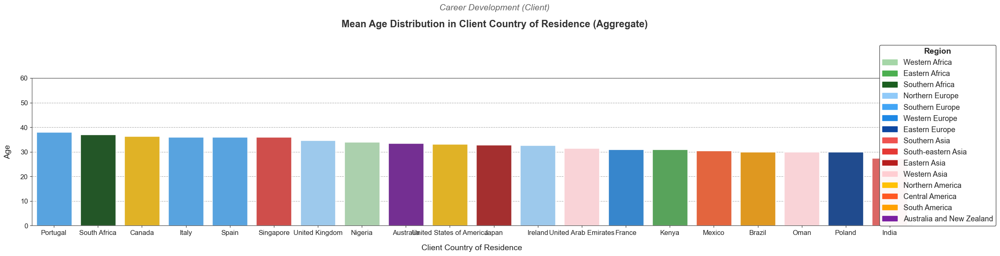

In [14]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.country2short)
df['Client Country of Residence'] = df['Client Country of Residence'].apply(countryHelper.fix_country_naming)
df['Client Country of Origin'] = df['Race'].apply(countryHelper.race2country)

df_2 = countryHelper.get_country_average_y(df,x='Client Country of Residence',y='Age')
df_2['Continent'] = df_2['Client Country of Residence'].apply(lambda x: countryHelper.country2region(x)['region'])
df_2['Region']    = df_2['Client Country of Residence'].apply(lambda x: countryHelper.country2region(x)['subregion'])

plt = histogram.draw(
    df=df_2,x='Client Country of Residence', y='Age',
    hue='Region', ylim=60, ystep=10,
    dataset=f'{dataset} (Client)\n\n', aggregate=True,
    long_layout=True, legend=(1.1,1.25),
    title_size=17,rotation=0,
    figsize=(9,9)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Histogram) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Histogram) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Histogram) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age and Country of Residence (Histogram) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Employment by Subsector

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:556: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


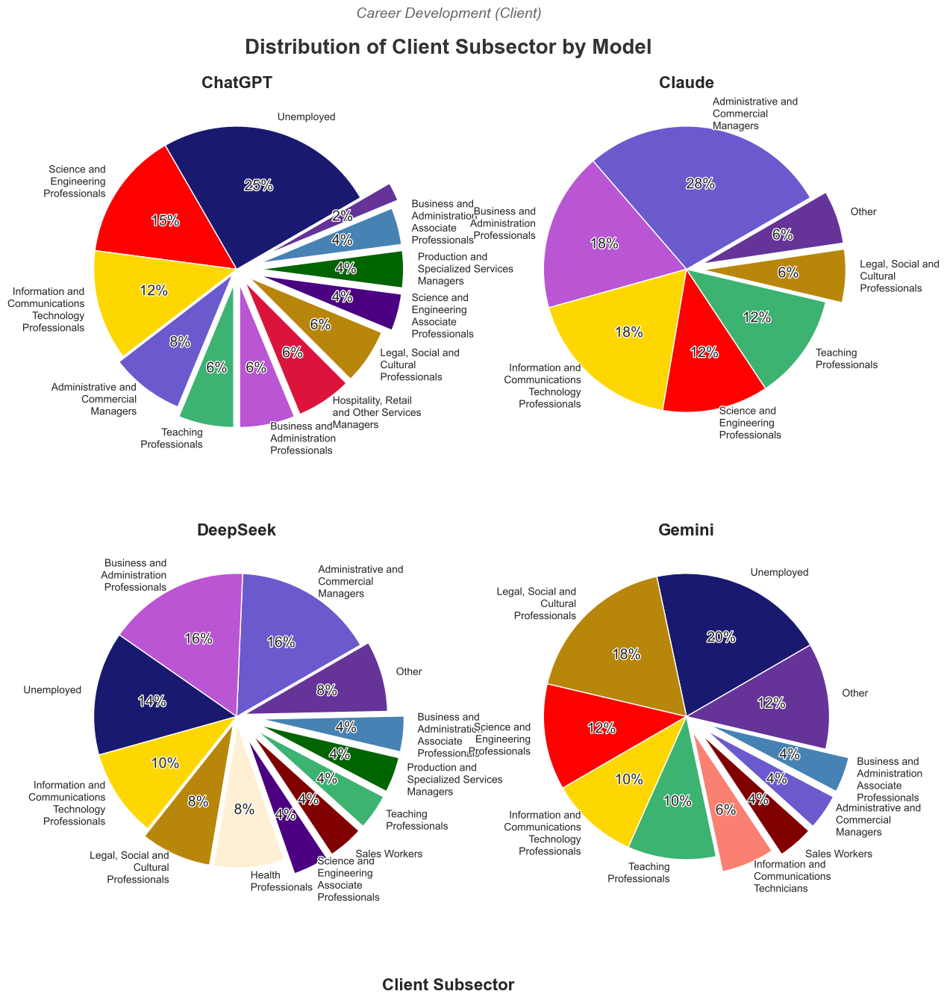

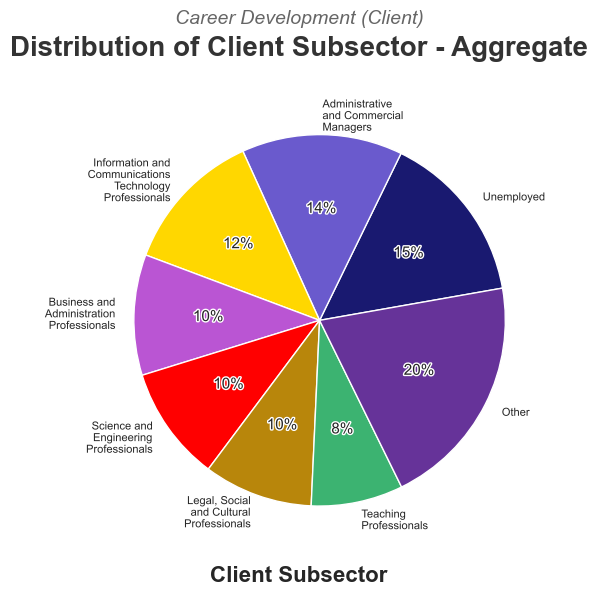

In [15]:
df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Sector']    = df['Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Client Subsector'] = df['Employment'].apply(lambda job: jobHelper.employment2subsector(job))

plt = piechart.draw(
    df,x="Client Subsector",
    dataset=f'{dataset} (Client)', figsize=(14,14),
    aggregate=False, other=0.04,
    text_width=18, rotation=30, space=0.25,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Piechart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Piechart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df,x="Client Subsector",
    dataset=f'{dataset} (Client)',
    aggregate=True, other=0.04,
    text_width=15, rotation=10,
    figsize=(6,6),
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Piechart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Piechart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

Client Sector


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:312: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


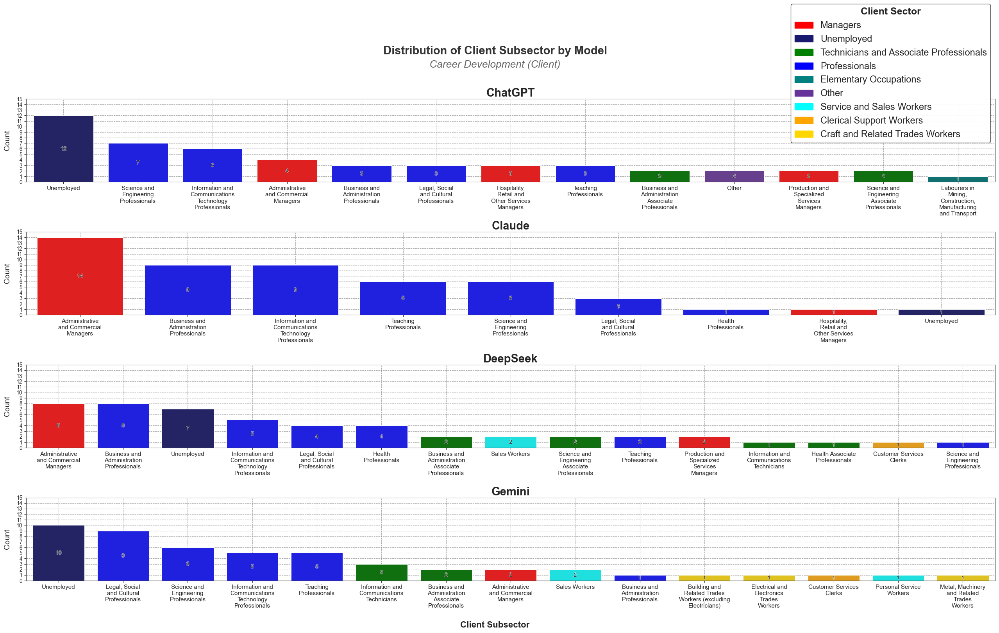

In [16]:
df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Sector']    = df['Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Client Subsector'] = df['Employment'].apply(lambda job: jobHelper.employment2subsector(job))

histogram = Histogram(models)
plt = histogram.draw(
    df,x='Client Subsector', hue='Client Sector',
    dataset=f'{dataset} (Client)',legend=(1,2.2),
    aggregate=False,long_layout=True,
    rotation=0, text_width=15, bar_labels=True,
    hspace=0.6,figsize=(32,16),
    title_size=21, grid=True
    # xtick_label_max_len=25
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Histogram)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Subsector (Histogram).eps"), format='eps', bbox_inches='tight')
plt.show()

### Employment by Sector

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:556: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


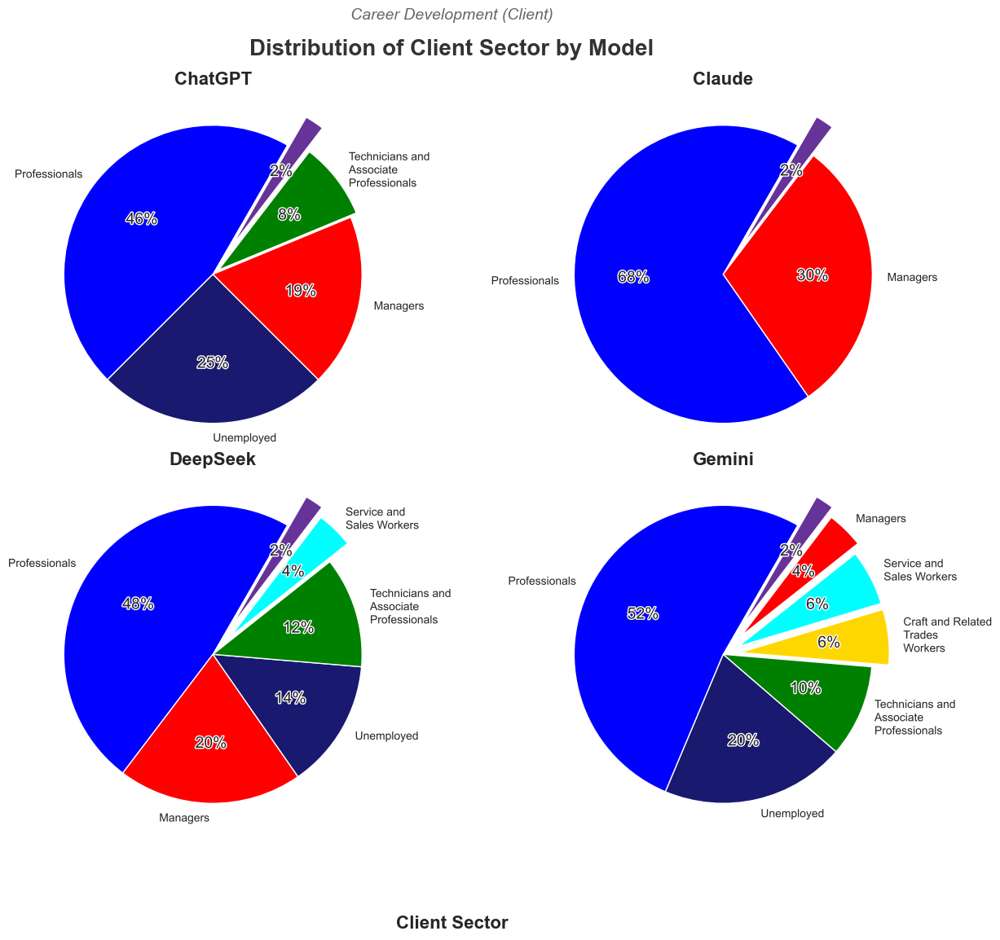

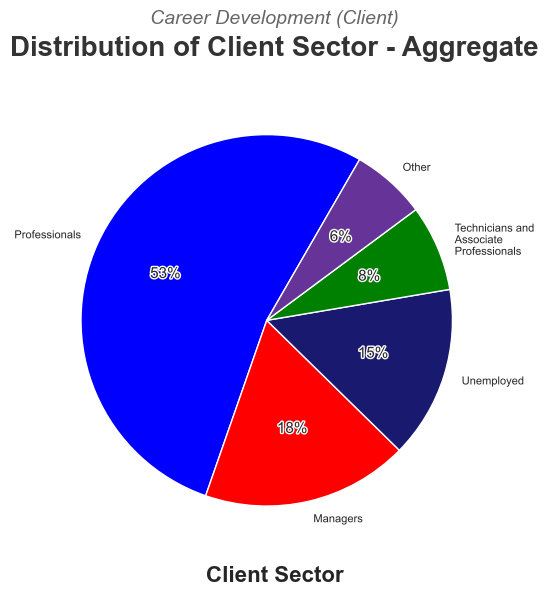

In [17]:
df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Sector']    = df['Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Client Subsector'] = df['Employment'].apply(lambda job: jobHelper.employment2subsector(job))

plt = piechart.draw(
    df,x="Client Sector",
    dataset=f'{dataset} (Client)',
    aggregate=False, other=0.04, space=0.02,
    text_width=15, rotation=60
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Sector (Piechart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Sector (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Sector (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Sector (Piechart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df,x="Client Sector", figsize=(6,6),
    dataset=f'{dataset} (Client)',
    aggregate=True, other=0.04,
    space=0.05, text_width=15, rotation=60,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Sector (Piechart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Sector (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Sector (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Employment by Sector (Piechart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Age, Education, Gender (BarChart)

associate's in marketing high school graduate high school diploma associate’s degree in graphic design associate’s degree in it associate’s degree in nursing associate’s degree in nursing associate’s degree in graphic design high school diploma associate’s degree in nursing associate’s degree in nursing masters in computer science a-levels Client Sex


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#8

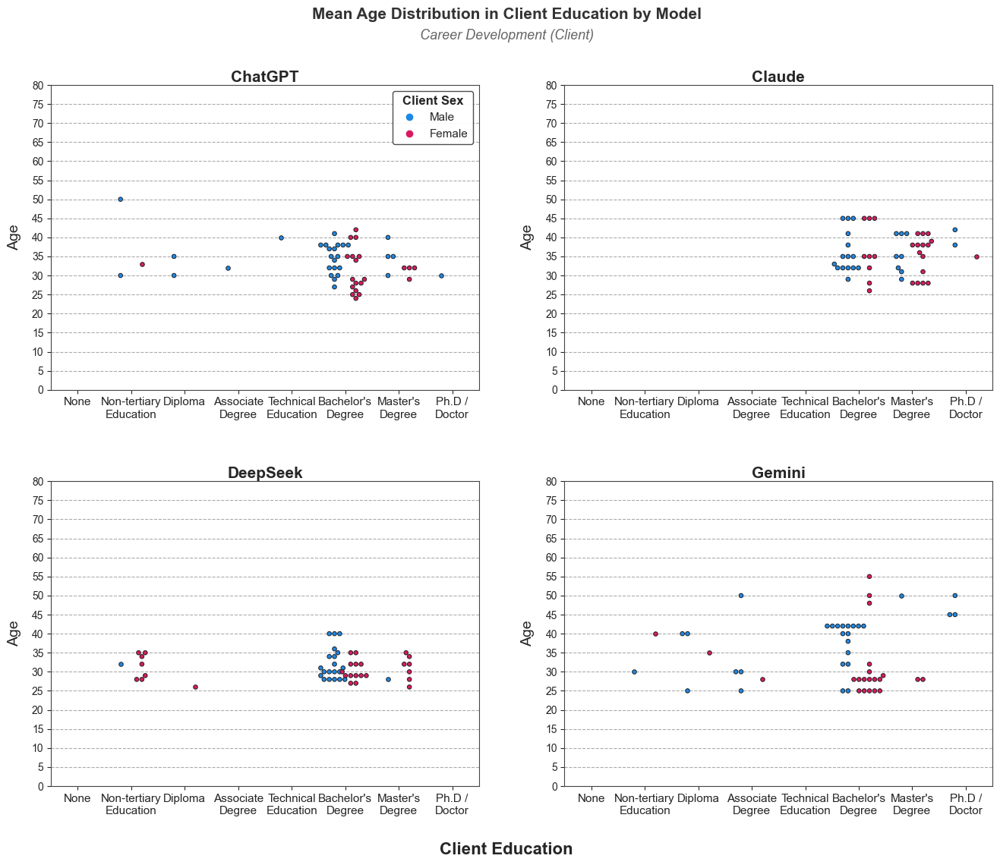

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


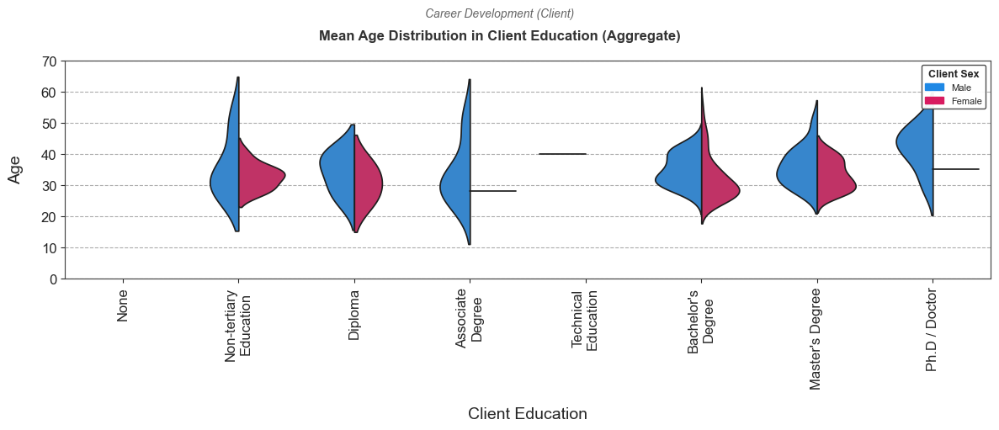

In [18]:
df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Education'] = df['Education'].apply(jobHelper.education2certification)
df['Client Sex'] = df['Sex'].apply(sexHelper.sex2standard)

plt = histogram.draw(
    df=df,x='Client Education',
    hue='Client Sex',y='Age',
    dataset=f'{dataset} (Client)',legend=(1,1),
    aggregate=False, text_width=12,
    rotation=0, ylim=80, ystep=5, violin=False,swarm=True,
    figsize=(16,12), grid=True, title_size=15
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Education Gender (BarChart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Education Gender (BarChart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Education Gender (BarChart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Education Gender (BarChart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = histogram.draw(
    df=df,x='Client Education',
    hue='Client Sex',y='Age',
    dataset=f'{dataset} (Client)\n\n', legend = (1,1),
    aggregate=True, text_width=15,
    rotation=90, ylim=70, ystep=10, violin=True,swarm=False,
    figsize=(12,5), grid=True, 
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Education Gender (BarChart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Education Gender (BarChart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Education Gender (BarChart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Education Gender (BarChart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Age, Employment, Gender (BarChart)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


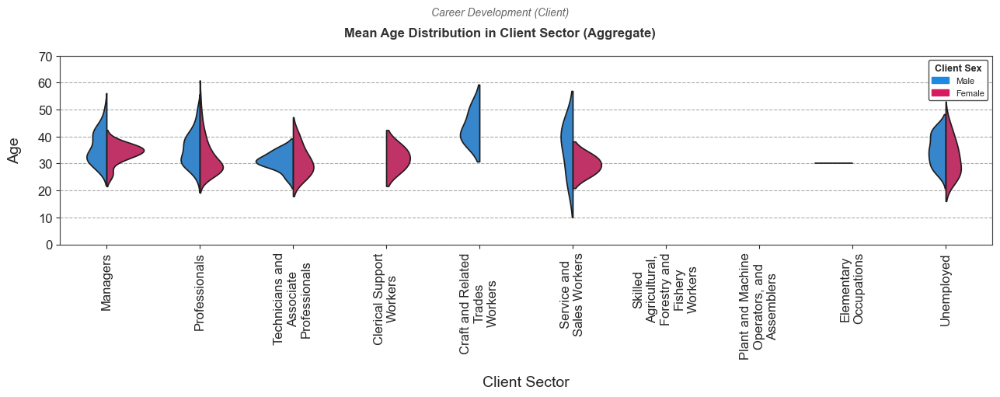

In [19]:
df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Sector'] = df['Employment'].apply(jobHelper.employment2sector)   
df['Client Sex']    = df['Sex'].apply(sexHelper.sex2standard)

# plt = histogram.draw(
#     df=df,x='Client Sector',
#     hue='Client Sex',y='Age',
#     dataset=f'{dataset} (Client)',
#     aggregate=False, text_width=15,
#     rotation=45, ylim=80, ystep=5, violin=False,swarm=True,
#     figsize=(20,12), grid=True, title_size=15,legend=(1,1.5),
# )
# plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Employment Gender (BarChart)"), dpi=300, bbox_inches='tight')
# plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Employment Gender (BarChart).eps"), format='eps', bbox_inches='tight')
# plt.show()

plt = histogram.draw(
    df=df,x='Client Sector',
    hue='Client Sex',y='Age',
    dataset=f'{dataset} (Client)\n\n',
    aggregate=True, text_width=15,
    rotation=90, ylim=70, ystep=10, violin=True,swarm=False,
    figsize=(13,5), grid=True, legend=(1,1)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Employment Gender (BarChart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Employment Gender (BarChart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Employment Gender (BarChart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Age Employment Gender (BarChart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender (Piechart)

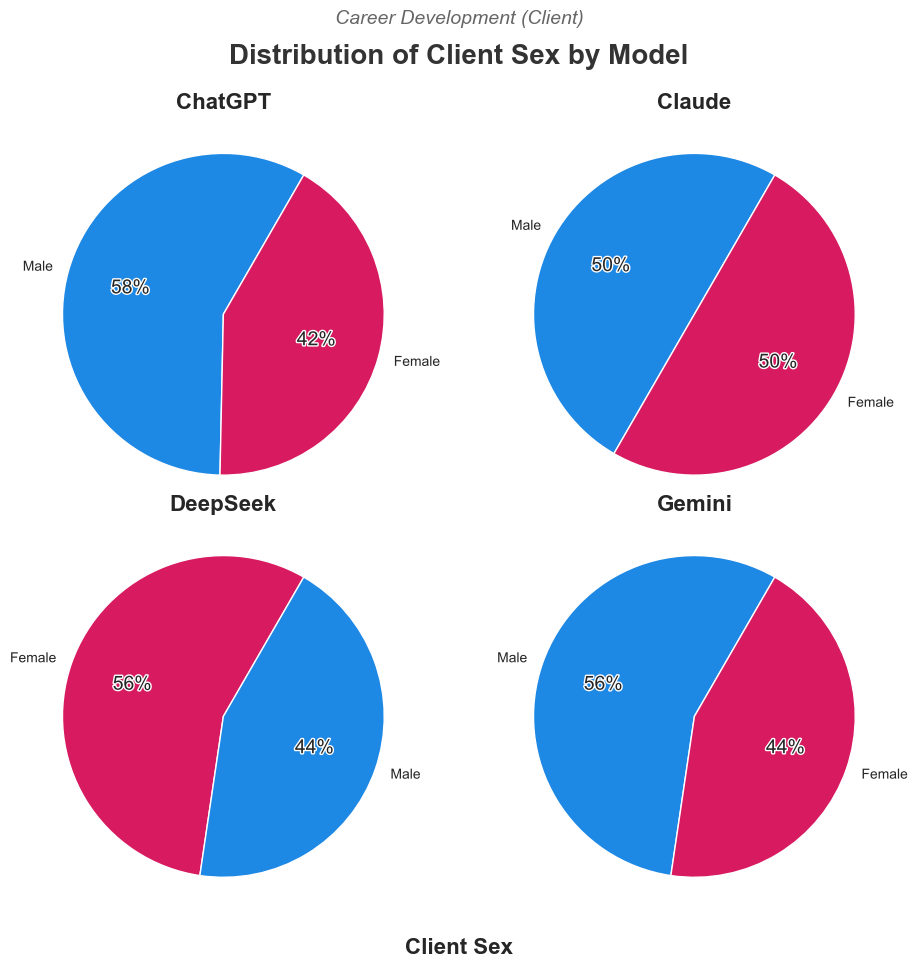

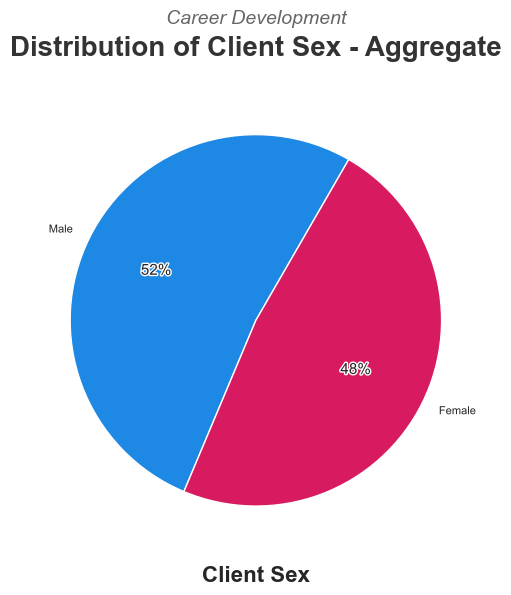

In [20]:
df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Sex'] = df['Sex'].apply(sexHelper.sex2standard)

plt = piechart.draw(
    df, x="Client Sex",
    dataset=f'{dataset} (Client)',
    aggregate=False, other=0.00,
    text_width=15, rotation=60,
    figsize=(10,10),space=0,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender (Piechart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender (Piechart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df, x="Client Sex",
    dataset=dataset,
    aggregate=True, other=0.04,
    text_width=15, rotation=60,
    figsize=(6,6),space=0,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender (Piechart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender (Piechart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()


### Gender and order of responses (Stacked Bar Chart)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


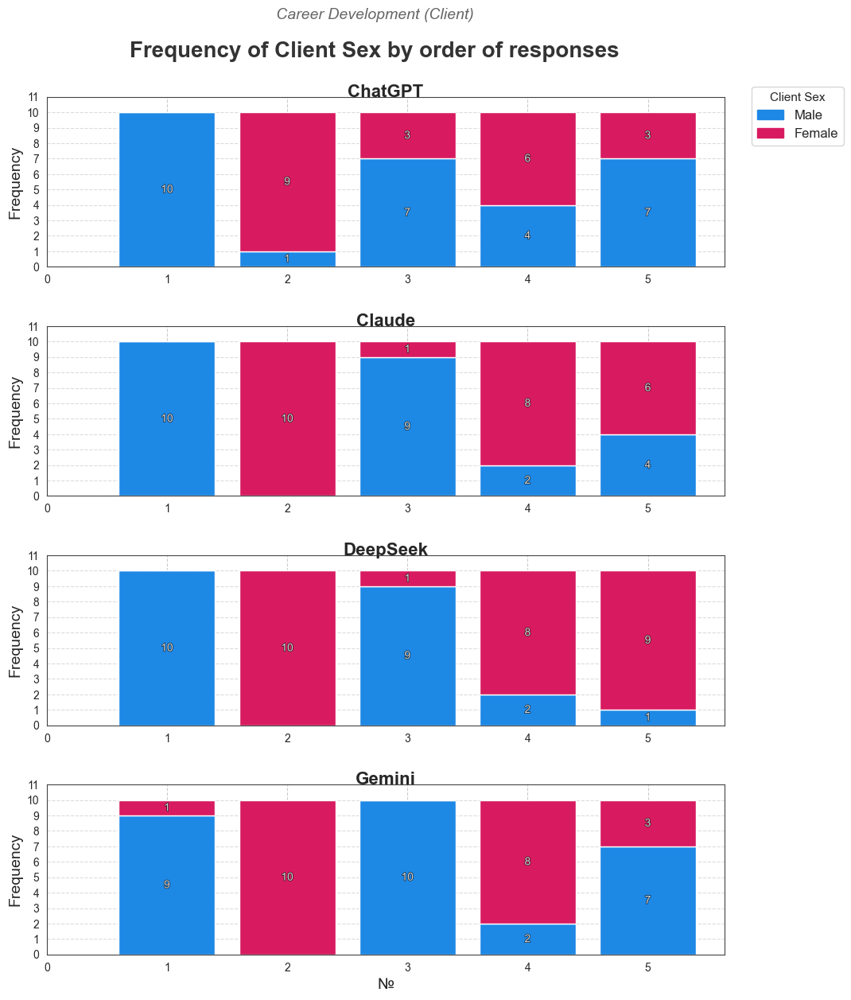

In [21]:
df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Sector']    = df['Employment'].apply(jobHelper.employment2sector)
df['Client Subsector'] = df['Employment'].apply(jobHelper.employment2subsector)
df['Client Sex']       = df['Sex'].apply(sexHelper.sex2standard)


plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Client Sex',
    space=0.35, ylim=11, bar_labels=True,
    figsize=(11,14), grid=True,dataset=f'{dataset} (Client)'
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and order of responses (Stacked Bar Chart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and order of responses (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and order of responses (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and order of responses (Stacked Bar Chart).eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender and Employment (Stacked Bar Chart)

associate's in marketing high school graduate high school diploma associate’s degree in graphic design associate’s degree in it associate’s degree in nursing associate’s degree in nursing associate’s degree in graphic design high school diploma associate’s degree in nursing associate’s degree in nursing masters in computer science a-levels 

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


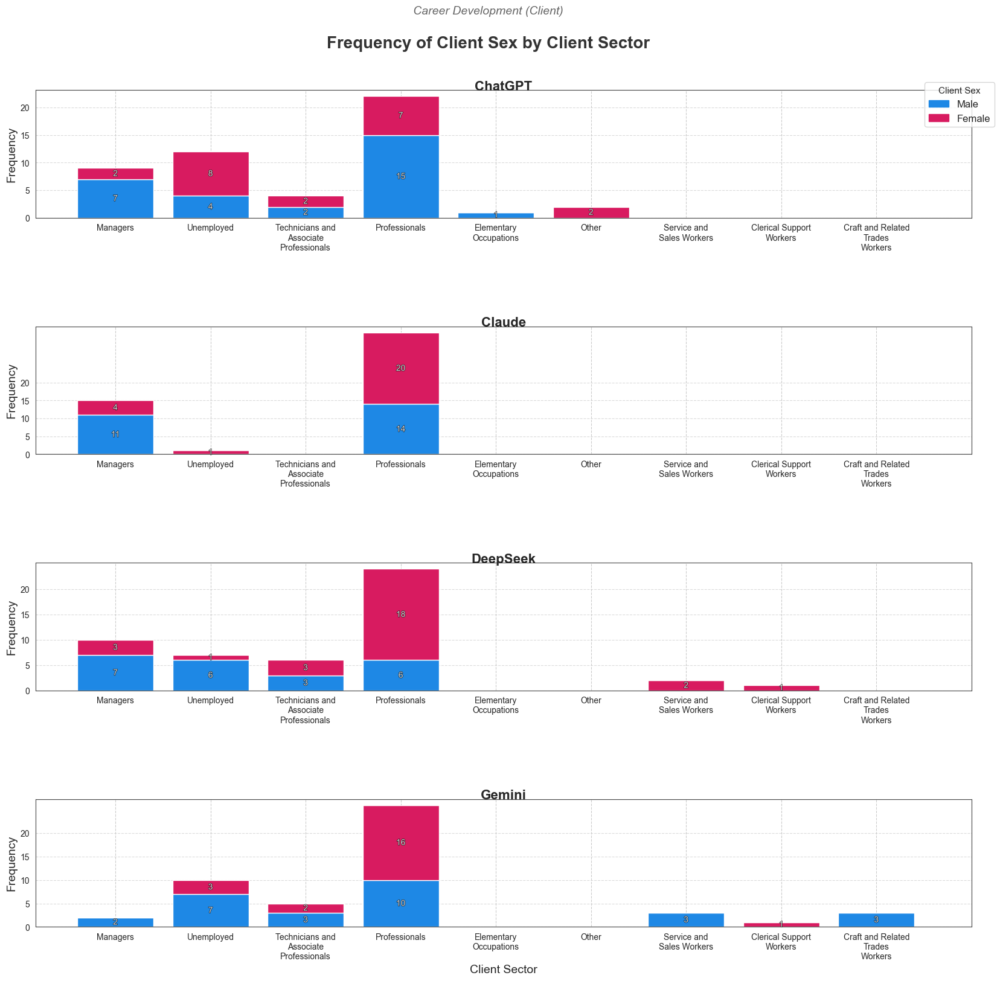

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


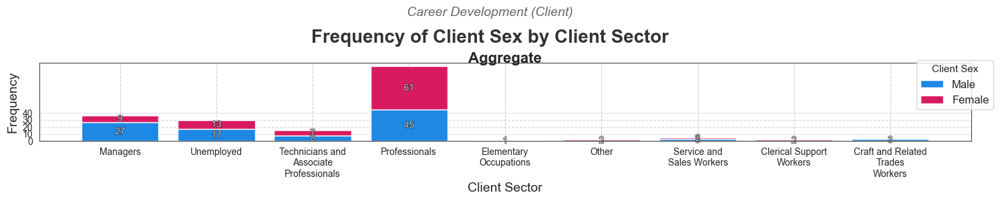

In [22]:
df = pd.concat([client_df[model].copy().assign(model=model) for model in models], ignore_index=True) # Use .copy()
df['Client Sector']    = df['Employment'].apply(jobHelper.employment2sector)   
df['Client Subsector'] = df['Employment'].apply(jobHelper.employment2subsector)
df['Client Education'] = df['Education'].apply(jobHelper.education2certification)
df['Client Sex']       = df['Sex'].apply(sexHelper.sex2standard)

plt = stackedBar.draw(
    df=df,x='Client Sector',stacked_hue='Client Sex', grid=True,
    aggregate=False, figsize=(20,18), bar_labels=True,
    space=0.85, ylim=20, ystep=5,txt_width=15, dataset=f'{dataset} (Client)'
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Employment (Stacked Bar Chart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Employment (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Employment (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Employment (Stacked Bar Chart).eps"), format='eps', bbox_inches='tight')
plt.show()


plt = stackedBar.draw(
    df=df,x='Client Sector',stacked_hue='Client Sex', grid=True, 
    space=0.85, ylim=40, ystep=10, bar_labels=True,
    txt_width=15, figsize=(18,10), aggregate=True,
    dataset=f'{dataset} (Client)' # Add dataset for aggregate title
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Employment (Stacked Bar Chart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Employment (Stacked Bar Chart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Employment (Stacked Bar Chart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Employment (Stacked Bar Chart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()


### Gender and Education (Stacked Bar Chart)

associate's in marketing high school graduate high school diploma associate’s degree in graphic design associate’s degree in it associate’s degree in nursing associate’s degree in nursing associate’s degree in graphic design high school diploma associate’s degree in nursing associate’s degree in nursing masters in computer science a-levels 

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


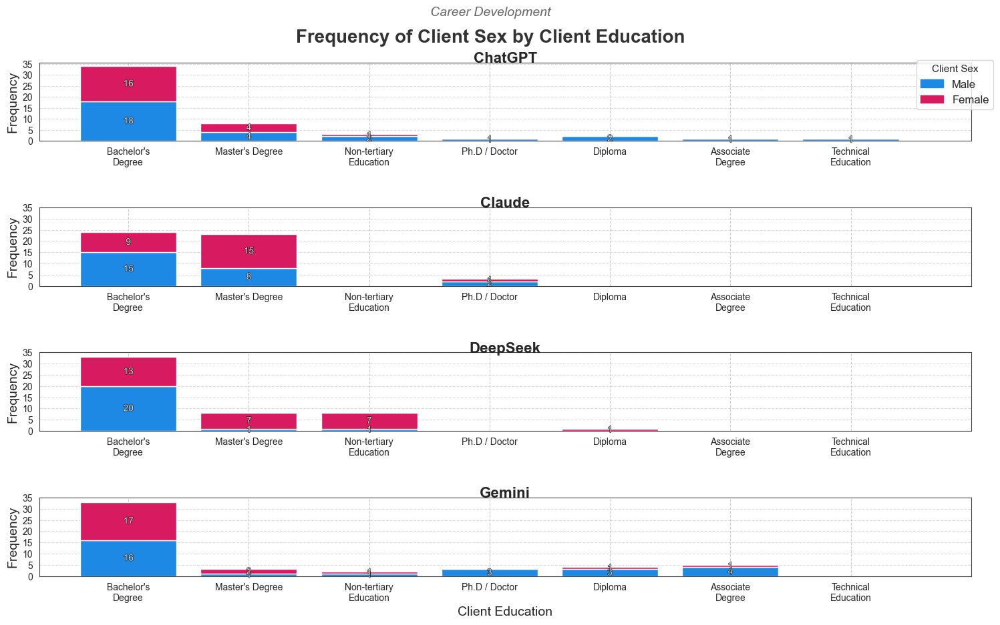

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


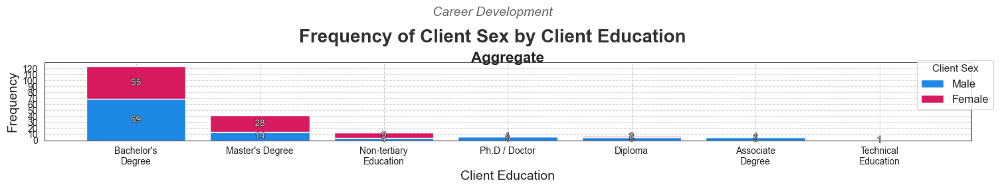

In [23]:
from draw import squeeze_text

dfs = {
    case_study: {
        model: pd.read_csv(os.path.join("Case Studies", case_study, f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}

df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Client Education'] = df['Client Education'].apply(jobHelper.education2certification)
df['Client Sex'] = df['Client Sex'].apply(sexHelper.sex2standard)

plt = stackedBar.draw(
    df=df, x='Client Education', stacked_hue='Client Sex', grid=True,
    space=0.85, ylim=35, ystep=5, bar_labels=True,
    txt_width=15, figsize=(18,10), dataset=dataset
)
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Client Education (Stacked Bar Chart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Client Education (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Client Education (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.show()

plt = stackedBar.draw(
    df=df, x='Client Education', stacked_hue='Client Sex', grid=True,
    space=0.85, ylim=120, ystep=10, bar_labels=True,
    txt_width=15, figsize=(18,10), aggregate=True, dataset=dataset
)
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Client Education (Stacked Bar Chart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Client Education (Stacked Bar Chart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Client Education (Stacked Bar Chart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.show()


### Gender and Age (Population Pyramid)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:580: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:618: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:620: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupb

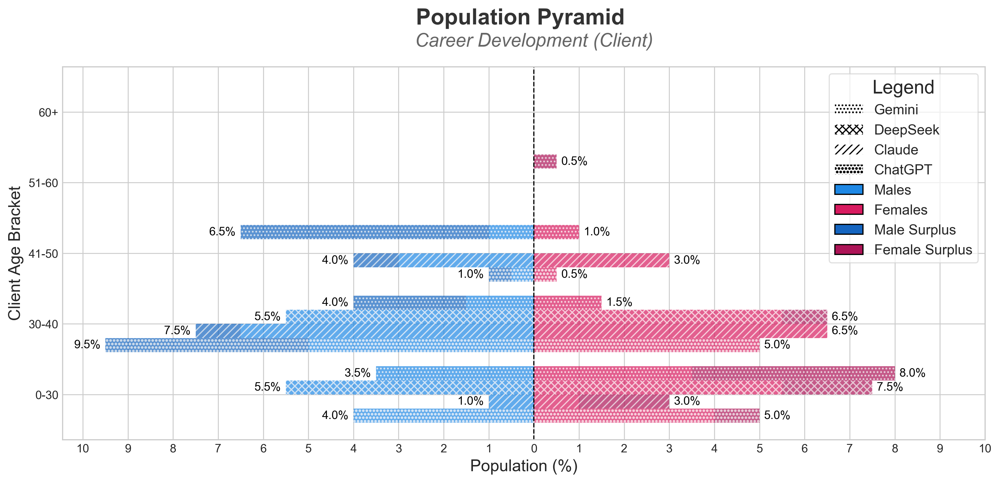

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:580: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:587: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  males   = df[df[stacked_hue] == 'Male'  ].groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:588: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future de

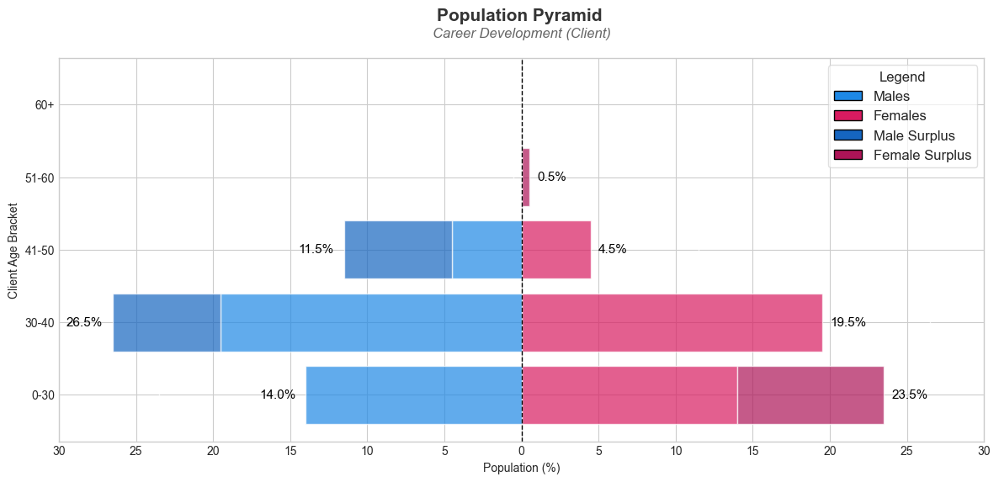

In [24]:
df = pd.concat([client_df[model].assign(model=model) for model in models], ignore_index=True)
df['Client Sex'] = df['Sex'].apply(sexHelper.sex2standard)


xlabels = ['0-30', '30-40', '41-50', '51-60', '60+']
df['Client Age Bracket'] = pd.cut(df['Age'], bins=[0, 30, 40, 50, 60, 100], labels=xlabels)

from draw import PopulationPyramid
pPyramid = PopulationPyramid(models=models)

plt = pPyramid.draw(
    df=df,x='Client Age Bracket',stacked_hue='Client Sex',dataset=f'{dataset} (Client)',
    xlabels=xlabels,aggregate=False, fontsize=14, figsize=(12,6)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Age (Population Pyramid)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Age (Population Pyramid).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Age (Population Pyramid).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Age (Population Pyramid).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = pPyramid.draw(
    df=df,x='Client Age Bracket',stacked_hue='Client Sex',dataset=f'{dataset} (Client)',
    xlabels=xlabels,aggregate=True, xlim=30, xstep=5, figsize=(12,6)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Age (Population Pyramid) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Age (Population Pyramid) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Age (Population Pyramid) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','client',f"Client Gender and Age (Population Pyramid) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()



## Career Development (Counselor)

C:\Users\Gabriel_Freeze\AppData\Local\Temp\ipykernel_20916\1826679608.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(avg_age_male, shade=True, label='Male', color='blue')
C:\Users\Gabriel_Freeze\AppData\Local\Temp\ipykernel_20916\1826679608.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(avg_age_female, shade=True, label='Female', color='pink')


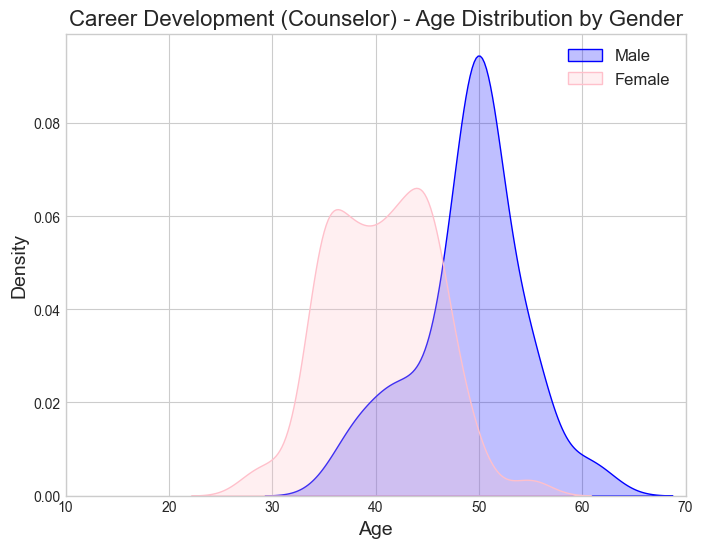

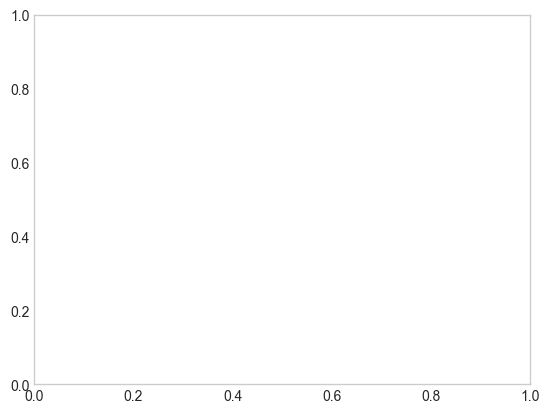

In [25]:
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Counselor Sex'] = df['Counselor Sex'].apply(sexHelper.sex2standard)
avg_age_male   = df[df['Counselor Sex'] == 'Male']  ['Counselor Age']  
avg_age_female = df[df['Counselor Sex'] == 'Female']['Counselor Age']

plt.figure(figsize=(8, 6))
sns.kdeplot(avg_age_male, shade=True, label='Male', color='blue')
sns.kdeplot(avg_age_female, shade=True, label='Female', color='pink')
plt.xlabel('Age')
plt.ylabel('Density')
plt.title(f'{dataset} (Counselor) - Age Distribution by Gender')
plt.xlim(10, 70)
plt.grid(True)
plt.legend()
plt.show()
plt.grid(False)


In [26]:
mean_age_by_sex = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)
mean_age_by_sex['Sex'] = mean_age_by_sex['Sex'].apply(sexHelper.sex2standard)
mean_ages = mean_age_by_sex.groupby('Sex')['Age'].mean()
print(mean_ages)



Sex
Female    40.645669
Male      49.070423
Other     40.000000
Name: Age, dtype: float64


### Country of Origin by Race (Map)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


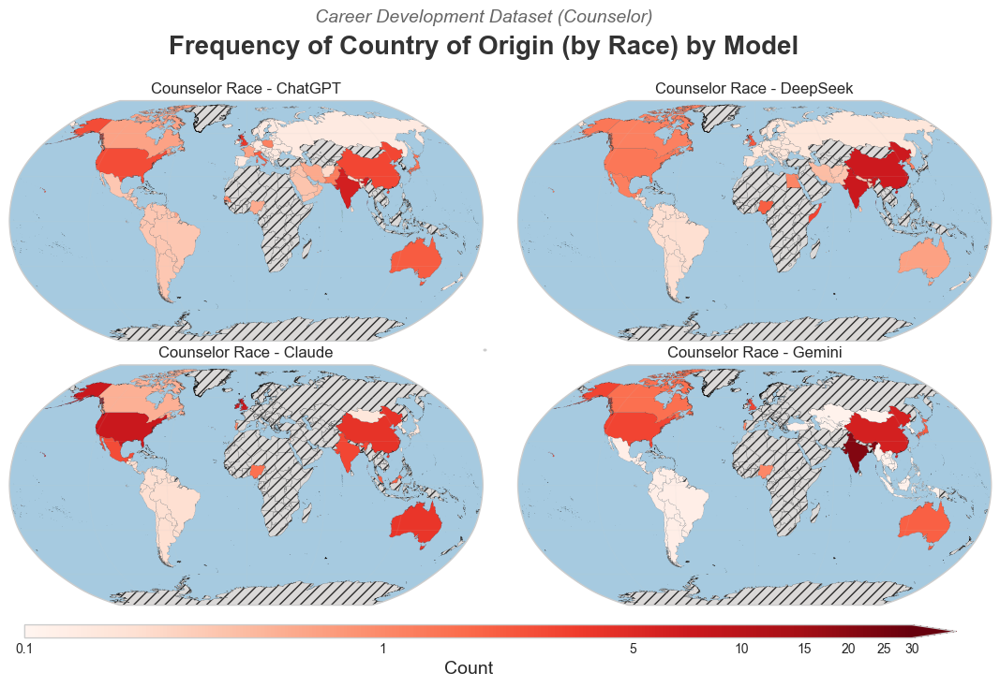

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


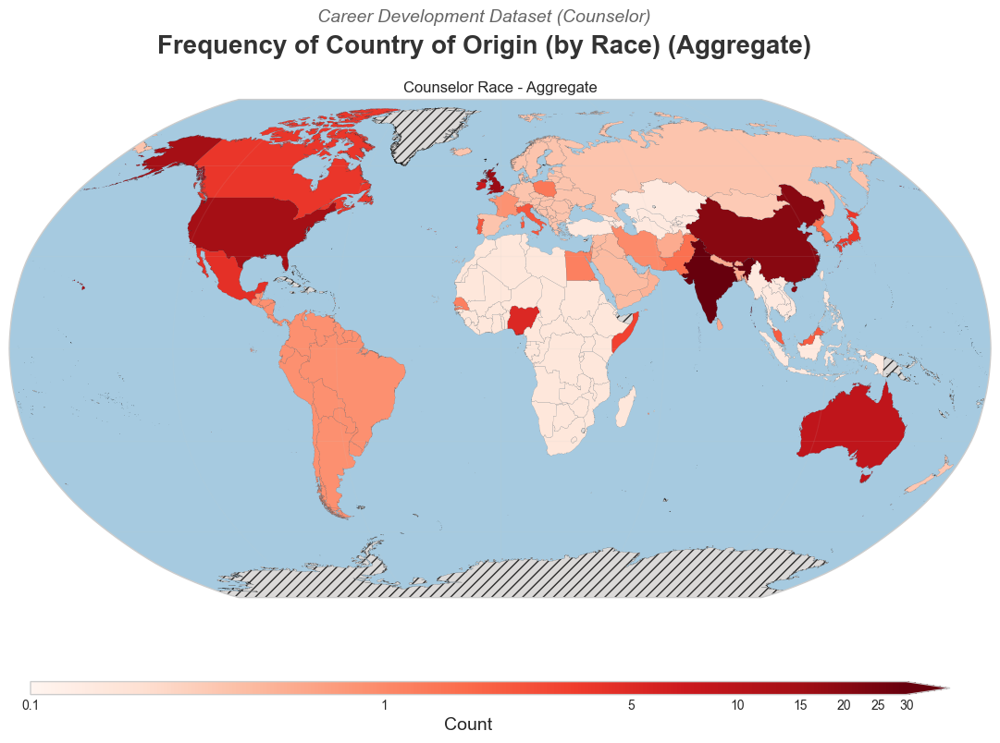

In [27]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = counselor_df[model].copy()
    df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Counselor Country of Origin'] = df['Race'].apply(countryHelper.race2country)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Counselor Country of Origin',
        title=f'Counselor Race - {model}',
        cmap='Reds', ax=axs[i%2][i//2],step=5,
        low_poly=False, log=True,
        max_count=30, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Frequency of Country of Origin (by Race) by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Counselor)', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)

df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.fix_country_naming)
df['Counselor Country of Origin'] = df['Race'].apply(countryHelper.race2country)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Counselor Country of Origin',
    title=f'Counselor Race - Aggregate',
    cmap='Reds', ax=ax, step=5,
    low_poly=False, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)

fig.suptitle('Frequency of Country of Origin (by Race) (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Counselor)', 
         ha='center', fontsize=14, color='#666666', style='italic')

plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Country of Origin by Race (Histogram)

Continent


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:312: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect

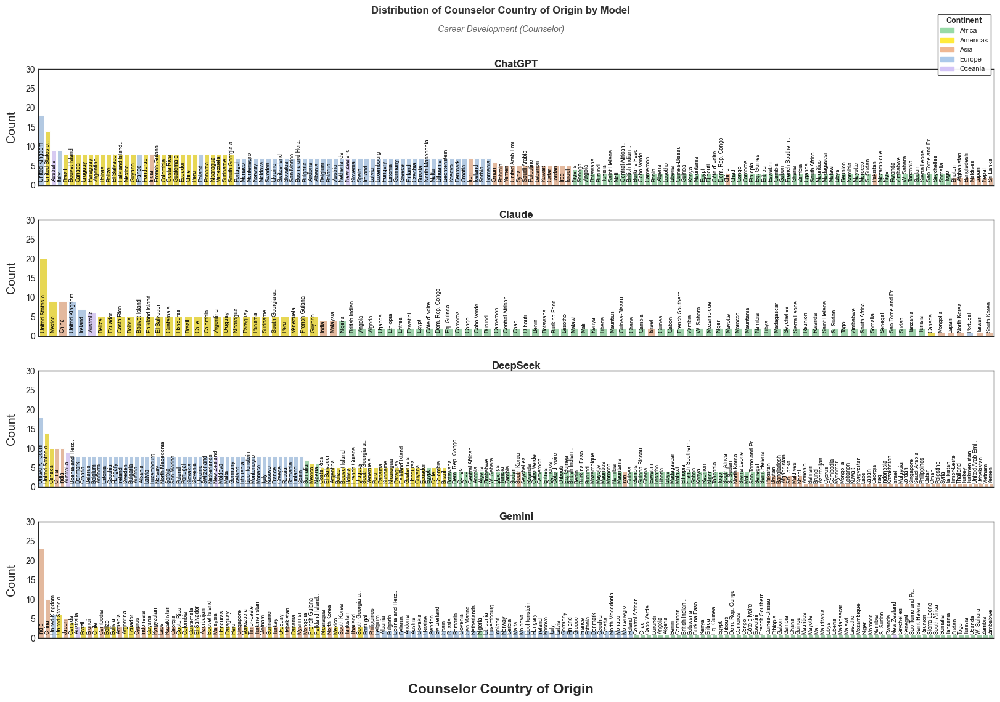

In [28]:
df = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)
df['Counselor Country of Origin'] = df['Race']  \
    .apply(countryHelper.race2country) \
    .apply(countryHelper.fix_country_naming)

df_plot = df[["Counselor Country of Origin",'model']].copy()
df_plot = df_plot.explode('Counselor Country of Origin')
df_plot['Region'] = df_plot['Counselor Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df_plot['Continent'] = df_plot['Counselor Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

#TODO: If hue is continet/region, use a map instead of a legend to show the colors
plt = histogram.draw(
    df=df_plot,x='Counselor Country of Origin',
    hue='Continent',
    dataset=f'{dataset} (Counselor)', ylim=30,ystep=5,
    aggregate=False,long_layout=True,
    xtick_label_max_len=15,
    figsize=(20,12), legend=(1,1.5),
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Histogram)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Origin by Race (Histogram).eps"), format='eps', bbox_inches='tight')
plt.show()

### Country of Residence (Map + Histogram)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


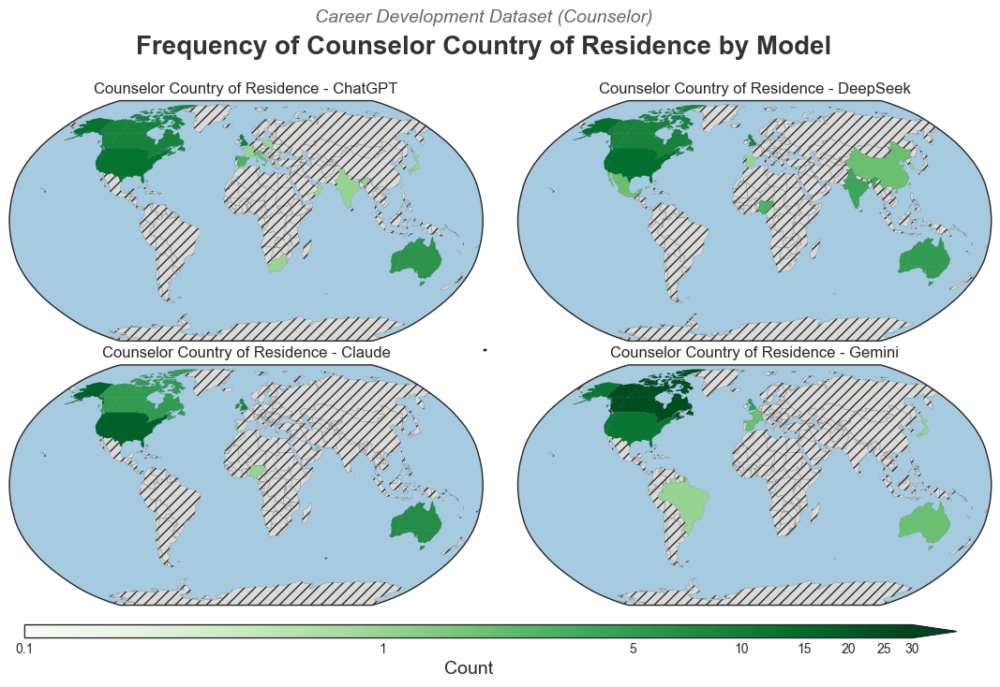

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


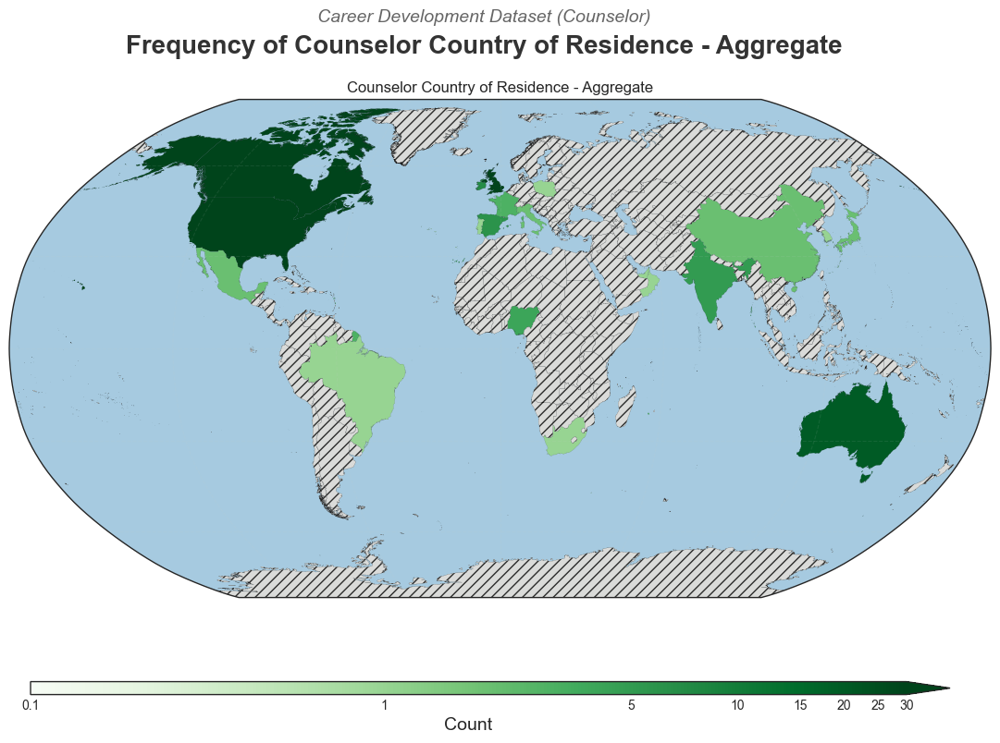

In [29]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = counselor_df[model].copy()
    df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.fix_country_naming)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Counselor Country of Residence',
        title=f'Counselor Country of Residence - {model}',
        cmap='Greens', ax=axs[i%2][i//2],
        low_poly=True, log=True, step=5,
        max_count=30, legend=[0,0,share_legend,0][i],
    )

fig.suptitle('Frequency of Counselor Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Counselor)', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)
df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.fix_country_naming)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Counselor Country of Residence',
    title=f'Counselor Country of Residence - Aggregate',
    cmap='Greens', ax=ax,step=5,
    low_poly=False, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Frequency of Counselor Country of Residence - Aggregate', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Counselor)', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:312: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


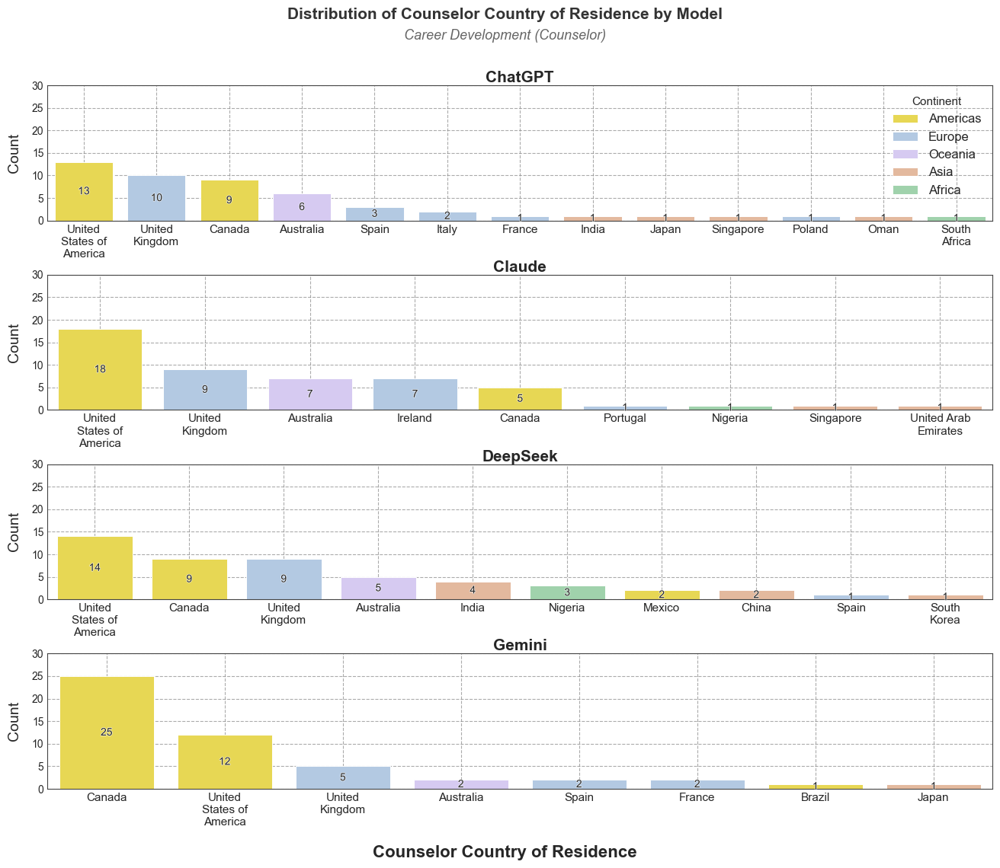

In [30]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)
df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.country2short)
df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.fix_country_naming)
df['Region'] = df['Counselor Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Counselor Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = histogram.draw(
    df=df,x='Counselor Country of Residence',
    hue='Continent', text_width=10, bar_labels=True,
    dataset=f'{dataset} (Counselor)', grid=True, ylim=30,ystep=5,
    aggregate=False,long_layout=True, title_size=15,
    figsize=(16,12), rotation=0,hspace=0.4
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Histogram)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country of Residence (Histogram).eps"), format='eps', bbox_inches='tight')
plt.show()

### Country Ordering (Stacked)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


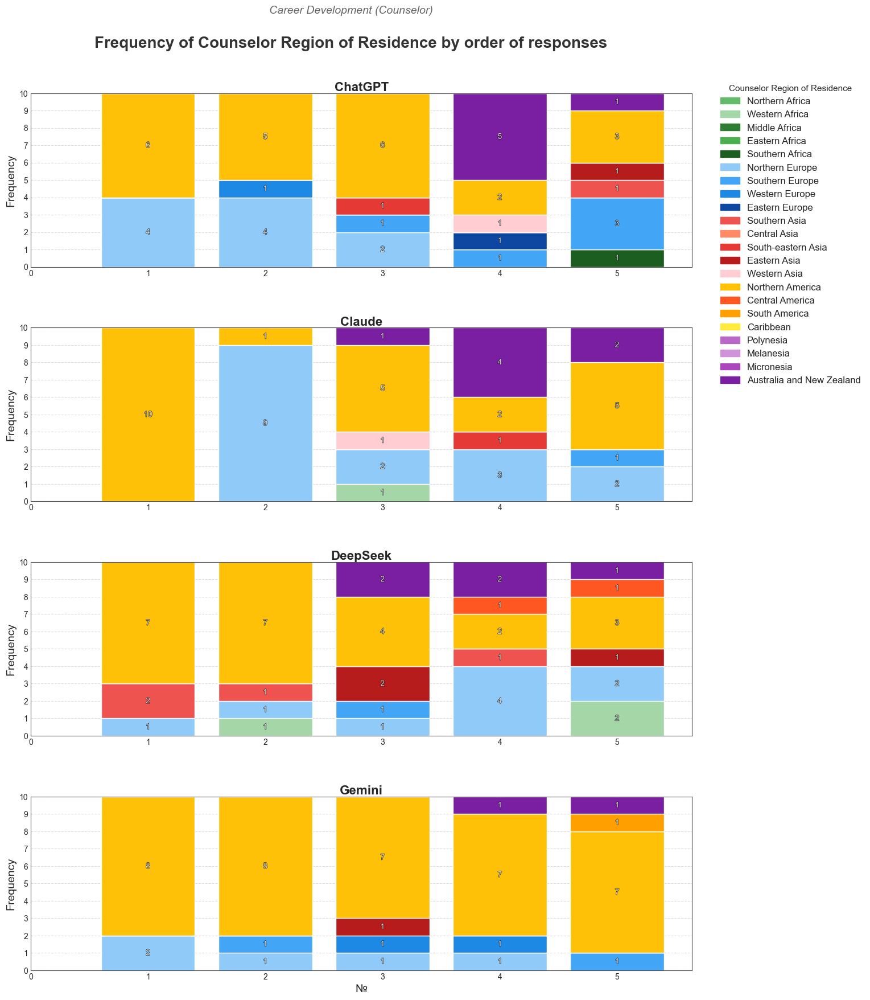

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


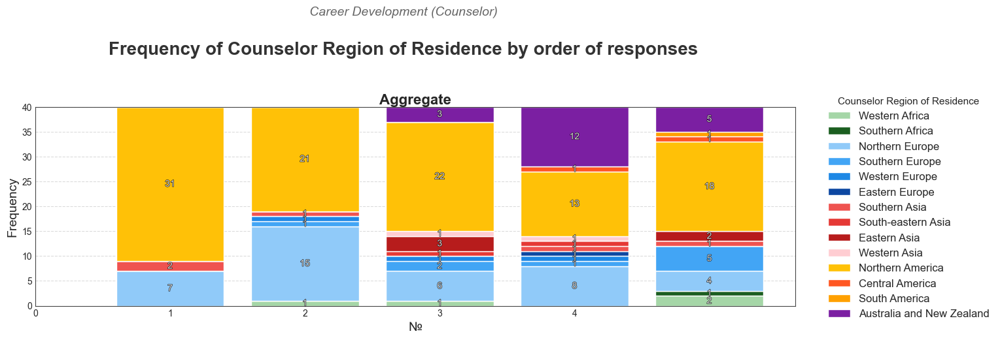

In [31]:
df = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)
df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.country2short)
df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.fix_country_naming)
df['Counselor Region of Residence']  = df['Counselor Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Counselor Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Counselor Region of Residence',
    space=0.35, ylim=10, bar_labels=True, dataset=f'{dataset} (Counselor)',
    figsize=(15,20), grid=True, legend=True
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country Ordering (Stacked)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country Ordering (Stacked).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country Ordering (Stacked).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country Ordering (Stacked).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Counselor Region of Residence', aggregate=True,
    space=0.35, ylim=40, bar_labels=True, dataset=f'{dataset} (Counselor)', ystep=5,
    figsize=(15,20), grid=True, legend=True
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country Ordering (Stacked) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country Ordering (Stacked) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country Ordering (Stacked) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Country Ordering (Stacked) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Age and Country of Residence

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


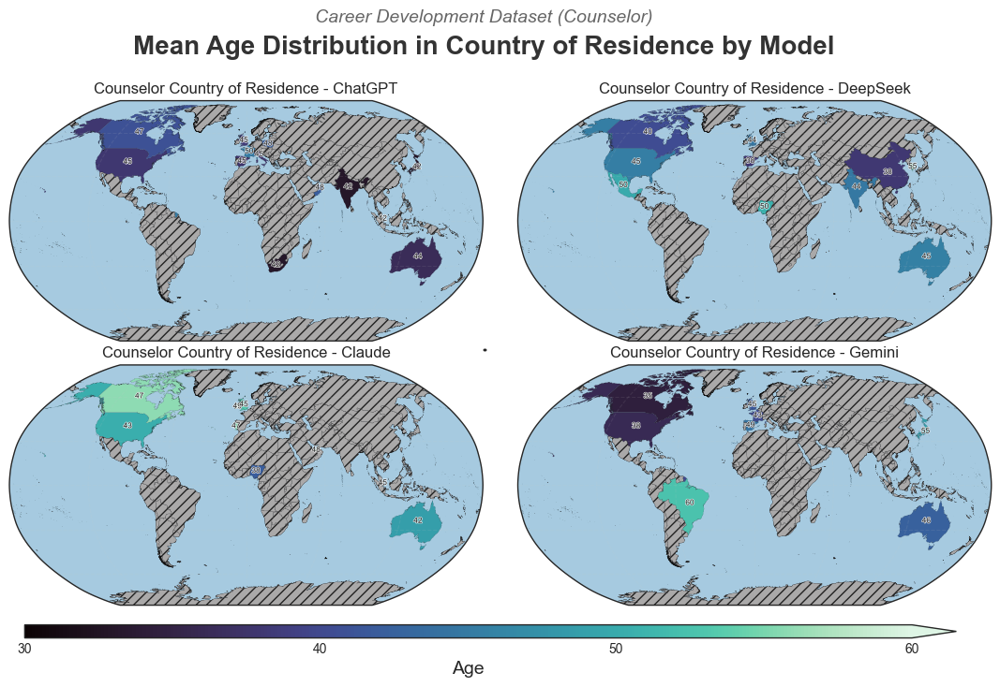

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


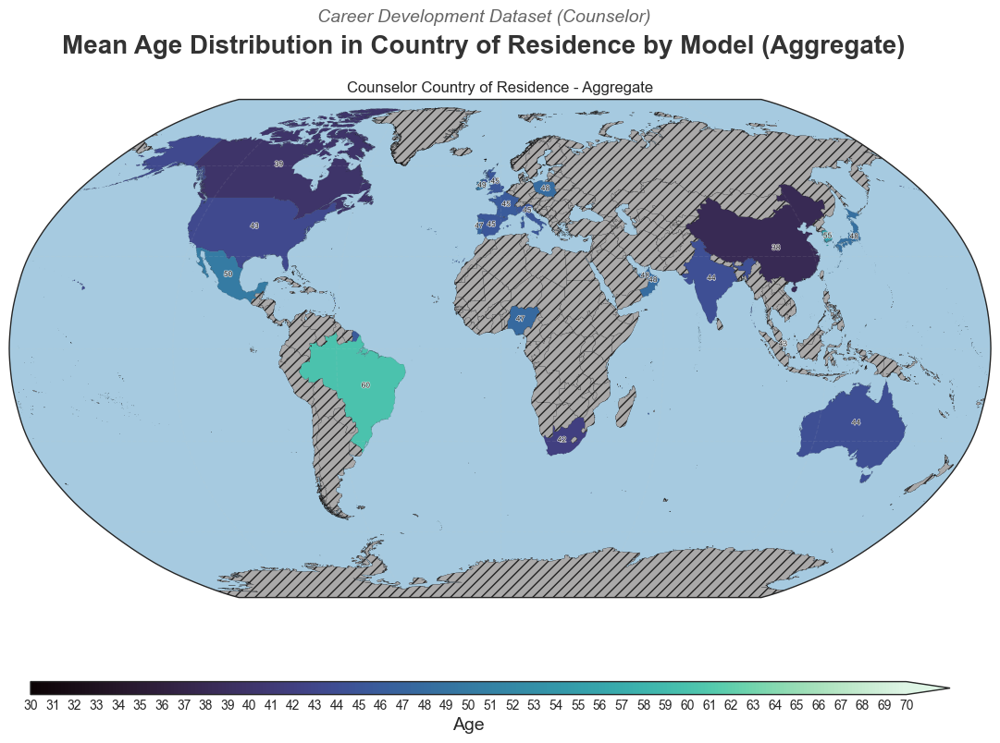

In [32]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = counselor_df[model].copy()
    df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Counselor Country of Origin'] = df['Race'].apply(countryHelper.race2country) # Note: Using Race for Origin
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Counselor Country of Residence', y='Age',
        title=f'Counselor Country of Residence - {model}', # Title adjusted
        cmap='mako', ax=axs[i%2][i//2], step=10,
        low_poly=False, log=False, show_labels=True,
        max_count=60, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Mean Age Distribution in Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Counselor)', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)
df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.fix_country_naming)
df['Counselor Country of Origin'] = df['Race'].apply(countryHelper.race2country) # Note: Using Race for Origin

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Counselor Country of Residence',y='Age',
    title=f'Counselor Country of Residence - Aggregate',
    cmap='mako', ax=ax, step=1,
    low_poly=False, log=False, show_labels=True,
    max_count=60, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Mean Age Distribution in Country of Residence by Model (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset (Counselor)', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


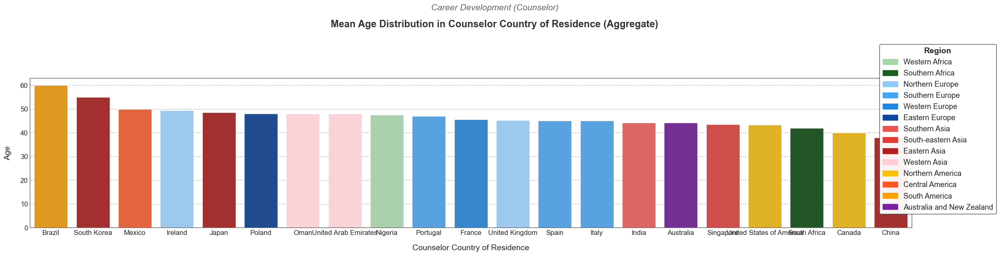

In [33]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)
df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.country2short)
df['Counselor Country of Residence'] = df['Counselor Country of Residence'].apply(countryHelper.fix_country_naming)
df['Counselor Country of Origin'] = df['Race'].apply(countryHelper.race2country) # Note: Using Race for Origin

df_2 = countryHelper.get_country_average_y(df,x='Counselor Country of Residence',y='Age')
df_2['Continent'] = df_2['Counselor Country of Residence'].apply(lambda x: countryHelper.country2region(x)['region'])
df_2['Region']    = df_2['Counselor Country of Residence'].apply(lambda x: countryHelper.country2region(x)['subregion'])

plt = histogram.draw(
    df=df_2,x='Counselor Country of Residence', y='Age',
    hue='Region', ylim=60, ystep=10,
    dataset=f'{dataset} (Counselor)\n\n', aggregate=True,
    long_layout=True, legend=(1.1,1.25),
    title_size=17,rotation=0,
    figsize=(9,9)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Histogram) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Histogram) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Histogram) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age and Country of Residence (Histogram) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Age, Education, Gender (BarChart)

mfa in creative industries m.sc. in career guidance and counseling m.a. in psychology d.phil. in organizational psychology m.sc. in career guidance and counselling m.sc. in career guidance and counseling m.a. in industrial-organizational psychology edd in educational leadership doctorate in psychology doctorate in sociology masters in counselling psychology masters in counselling psychology masters in counselling psychology masters in counselling psychology masters in counselling psychology doctorate in psychology Counselor Sex


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\anaconda3\envs\gender\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 5.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


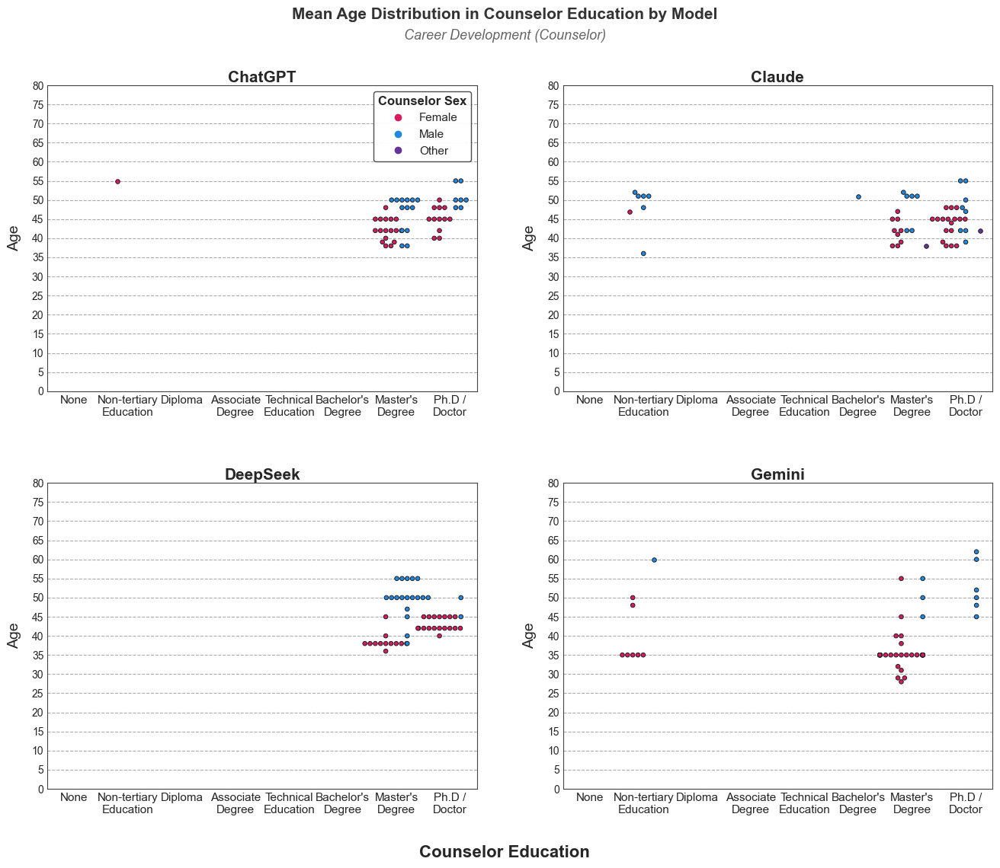

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


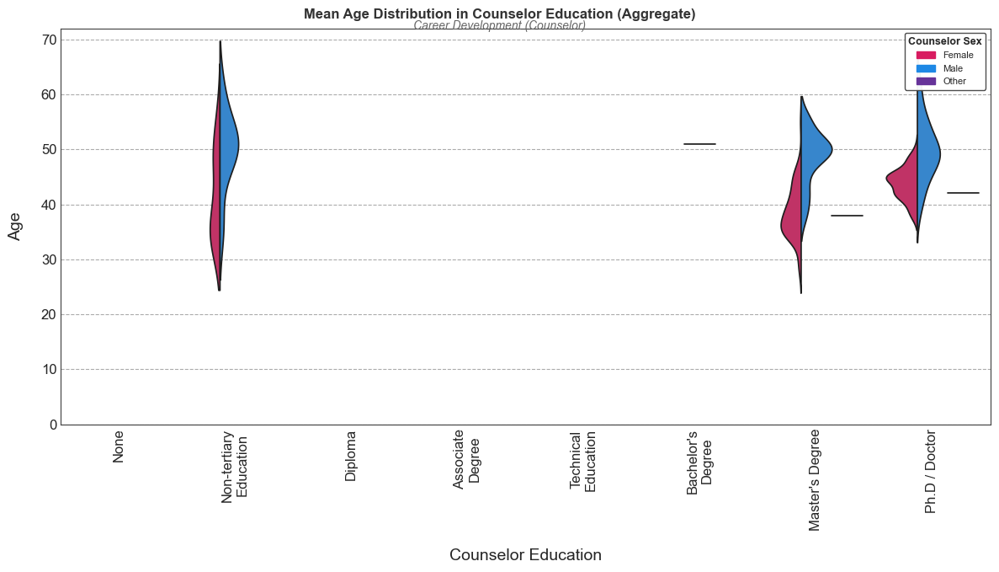

In [34]:
df = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)
df['Counselor Education'] = df['Education'].apply(jobHelper.education2certification)
df['Counselor Sex'] = df['Sex'].apply(sexHelper.sex2standard)

plt = histogram.draw(
    df=df,x='Counselor Education',
    hue='Counselor Sex',y='Age',
    dataset=f'{dataset} (Counselor)',legend=(1,1),
    aggregate=False, text_width=12,
    rotation=0, ylim=80, ystep=5, violin=False,swarm=True,
    figsize=(16,12), grid=True, title_size=15
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age Education Gender (BarChart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age Education Gender (BarChart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age Education Gender (BarChart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age Education Gender (BarChart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = histogram.draw(
    df=df,x='Counselor Education',
    hue='Counselor Sex',y='Age',
    dataset=f'{dataset} (Counselor)', legend = (1,1),
    aggregate=True, text_width=15,
    rotation=90, ylim=70, ystep=10, violin=True,swarm=False,
    figsize=(12,7), grid=True, 
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age Education Gender (BarChart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age Education Gender (BarChart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age Education Gender (BarChart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Age Education Gender (BarChart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender (Piechart)

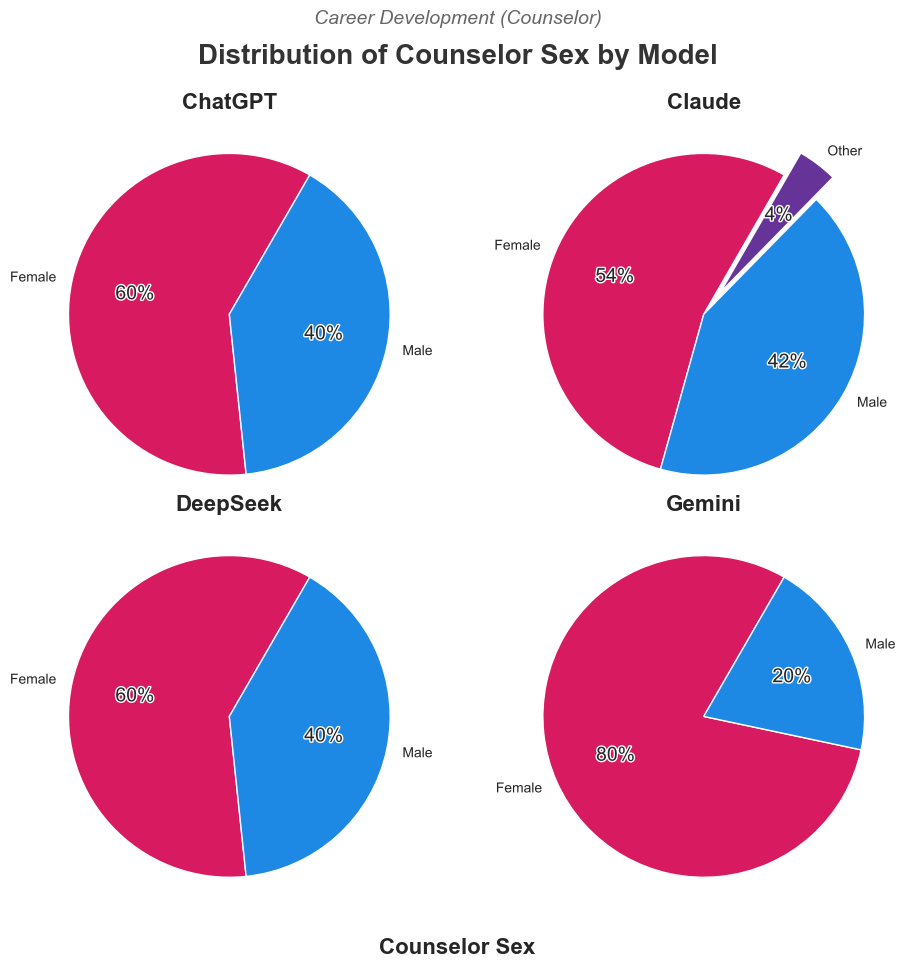

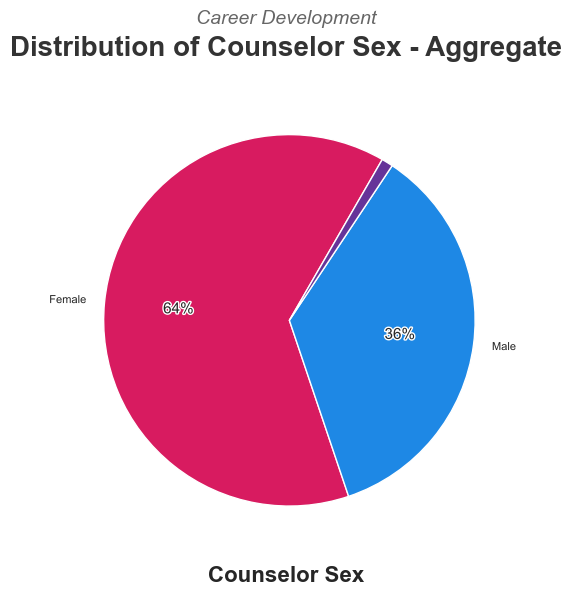

In [35]:
df = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)
df['Counselor Sex'] = df['Sex'].apply(sexHelper.sex2standard)

plt = piechart.draw(
    df, x="Counselor Sex",
    dataset=f'{dataset} (Counselor)',
    aggregate=False, other=0.00,
    text_width=15, rotation=60,
    figsize=(10,10),space=0,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender (Piechart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender (Piechart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df, x="Counselor Sex",
    dataset=dataset,
    aggregate=True, other=0.04,
    text_width=15, rotation=60,
    figsize=(6,6),space=0,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender (Piechart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender (Piechart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender and order of responses (Stacked Bar Chart)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


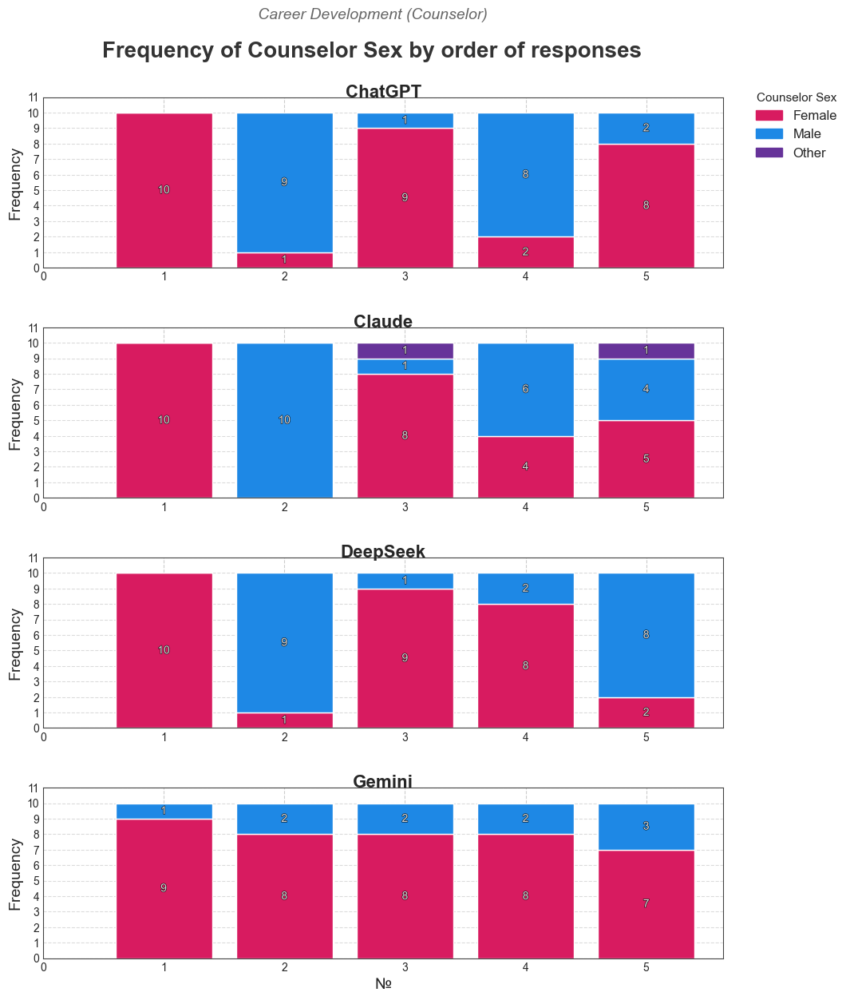

In [36]:
df = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)
df['Counselor Sex']       = df['Sex'].apply(sexHelper.sex2standard)

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Counselor Sex',
    space=0.35, ylim=11, bar_labels=True,
    figsize=(11,14), grid=True,dataset=f'{dataset} (Counselor)'
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and order of responses (Stacked Bar Chart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and order of responses (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and order of responses (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and order of responses (Stacked Bar Chart).eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender and Education (Stacked Bar Chart)

mfa in creative industries m.sc. in career guidance and counseling m.a. in psychology d.phil. in organizational psychology m.sc. in career guidance and counselling m.sc. in career guidance and counseling m.a. in industrial-organizational psychology edd in educational leadership doctorate in psychology doctorate in sociology masters in counselling psychology masters in counselling psychology masters in counselling psychology masters in counselling psychology masters in counselling psychology doctorate in psychology 

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


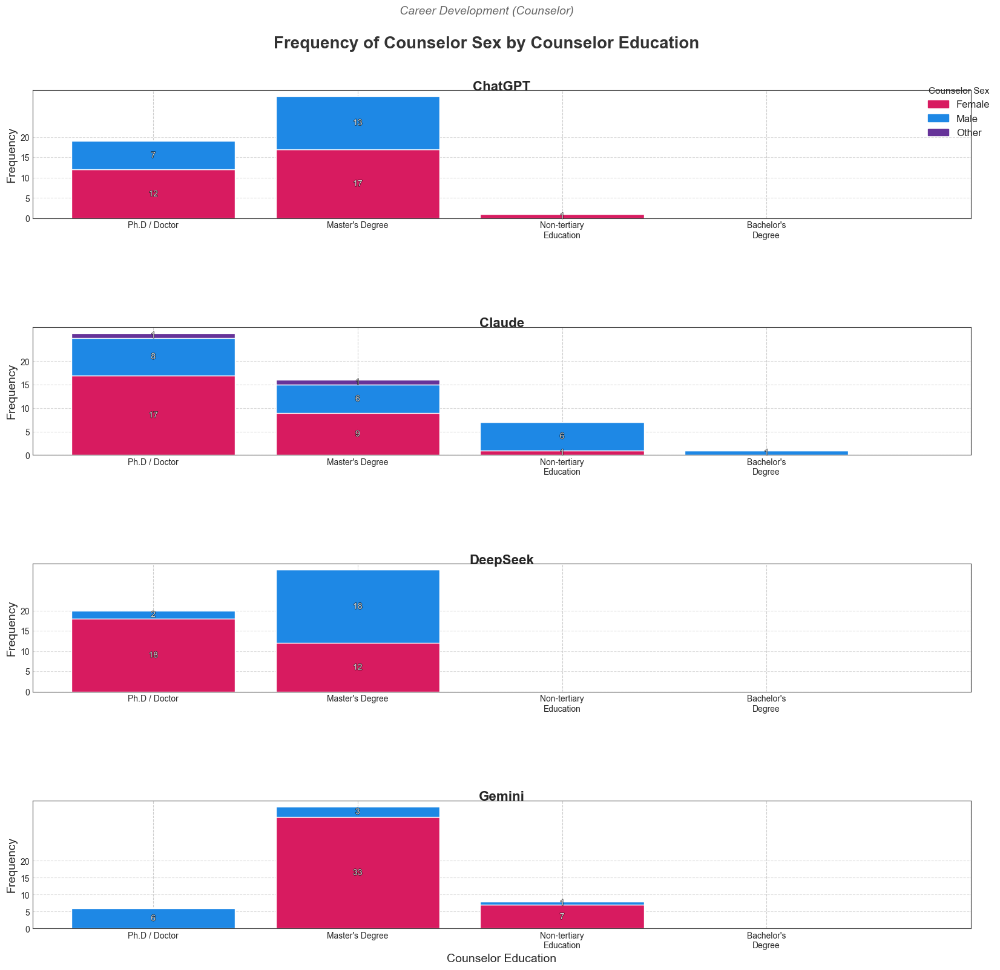

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


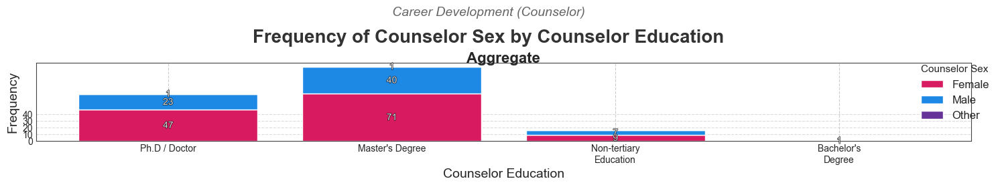

In [37]:
df = pd.concat([counselor_df[model].copy().assign(model=model) for model in models], ignore_index=True) # Use .copy()


df['Counselor Education'] = df['Education'].apply(jobHelper.education2certification)
df['Counselor Sex']       = df['Sex'].apply(sexHelper.sex2standard)

plt = stackedBar.draw(
    df=df,x='Counselor Education',stacked_hue='Counselor Sex', grid=True,
    aggregate=False, figsize=(20,18), bar_labels=True,
    space=0.85, ylim=20, ystep=5,txt_width=15, dataset=f'{dataset} (Counselor)'
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Education (Stacked Bar Chart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Education (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Education (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Education (Stacked Bar Chart).eps"), format='eps', bbox_inches='tight')
plt.show()


plt = stackedBar.draw(
    df=df,x='Counselor Education',stacked_hue='Counselor Sex', grid=True, 
    space=0.85, ylim=40, ystep=10, bar_labels=True,
    txt_width=15, figsize=(18,10), aggregate=True,
    dataset=f'{dataset} (Counselor)' # Add dataset for aggregate title
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Education (Stacked Bar Chart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Education (Stacked Bar Chart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Education (Stacked Bar Chart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Education (Stacked Bar Chart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()


### Gender and Age (Population Pyramid)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:580: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:618: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:620: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupb

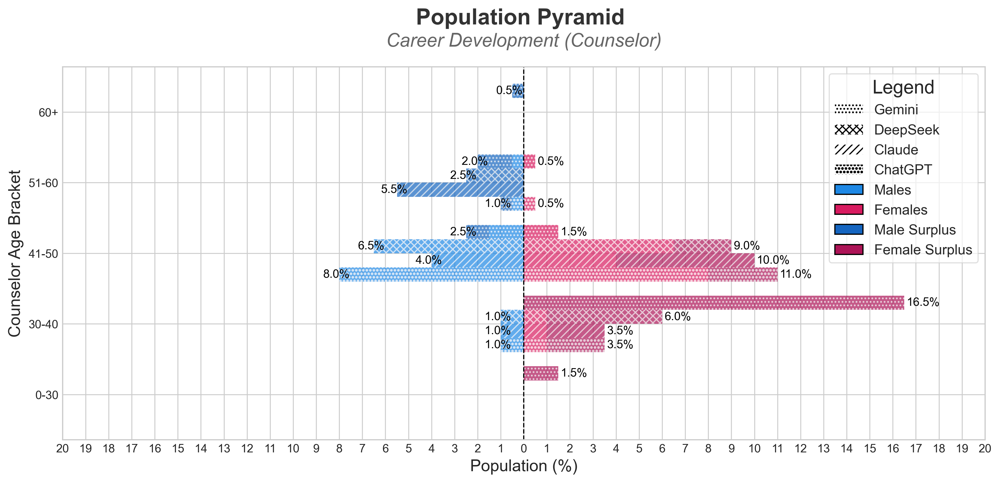

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:580: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:587: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  males   = df[df[stacked_hue] == 'Male'  ].groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:588: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future de

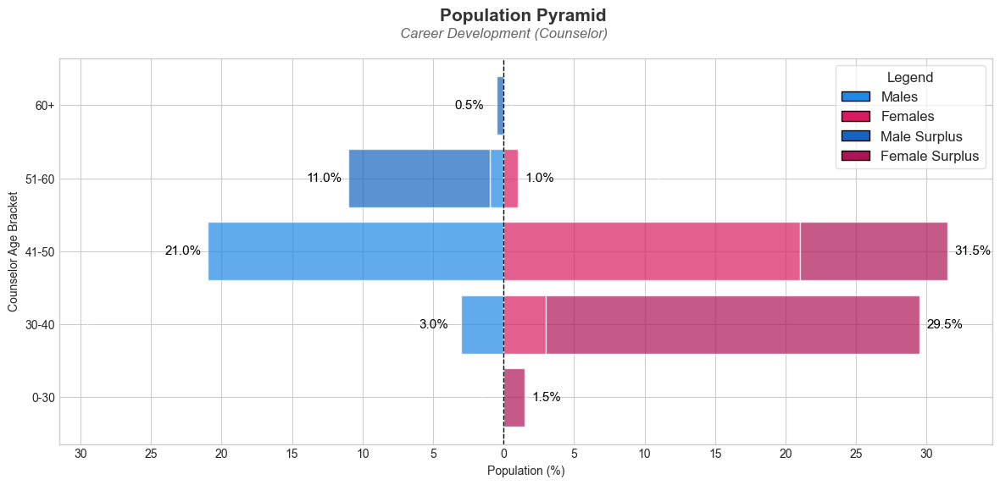

In [38]:
df = pd.concat([counselor_df[model].assign(model=model) for model in models], ignore_index=True)
df['Counselor Sex'] = df['Sex'].apply(sexHelper.sex2standard)


xlabels = ['0-30', '30-40', '41-50', '51-60', '60+']
df['Counselor Age Bracket'] = pd.cut(df['Age'], bins=[0, 30, 40, 50, 60, 100], labels=xlabels)

from draw import PopulationPyramid
pPyramid = PopulationPyramid(models=models)

plt = pPyramid.draw(
    df=df,x='Counselor Age Bracket',stacked_hue='Counselor Sex',dataset=f'{dataset} (Counselor)',
    xlabels=xlabels,aggregate=False, fontsize=14, figsize=(12,6), xlim=20
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Age (Population Pyramid)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Age (Population Pyramid).pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Age (Population Pyramid).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Age (Population Pyramid).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = pPyramid.draw(
    df=df,x='Counselor Age Bracket',stacked_hue='Counselor Sex',dataset=f'{dataset} (Counselor)',
    xlabels=xlabels,aggregate=True, xlim=30, xstep=5, figsize=(12,6)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Age (Population Pyramid) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Age (Population Pyramid) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Age (Population Pyramid) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','counselor',f"Counselor Gender and Age (Population Pyramid) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

